## Preprocessing

In [1]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import seaborn as sns
from scipy.spatial.distance import pdist, squareform

In [2]:
df = pd.read_csv("./dataset/DM1_game_dataset_cleaned.csv")

df.columns

Index(['Name', 'YearPublished', 'GameWeight', 'MinPlayers', 'MaxPlayers',
       'MfgPlaytime', 'MfgAgeRec', 'NumAlternates', 'NumExpansions',
       'NumImplementations', 'IsReimplementation', 'Kickstarted', 'Rating',
       'HasFamily', 'Category', 'Rank', 'EngagementLevel'],
      dtype='object')

Excluded columns due to high zero values: ['NumAlternates', 'NumExpansions', 'NumImplementations']
Log-transforming columns: ['YearPublished', 'MinPlayers', 'MaxPlayers', 'MfgPlaytime']
Columns used for IQR-based row outlier detection: ['YearPublished', 'GameWeight', 'MinPlayers', 'MaxPlayers', 'MfgPlaytime', 'MfgAgeRec', 'EngagementLevel']


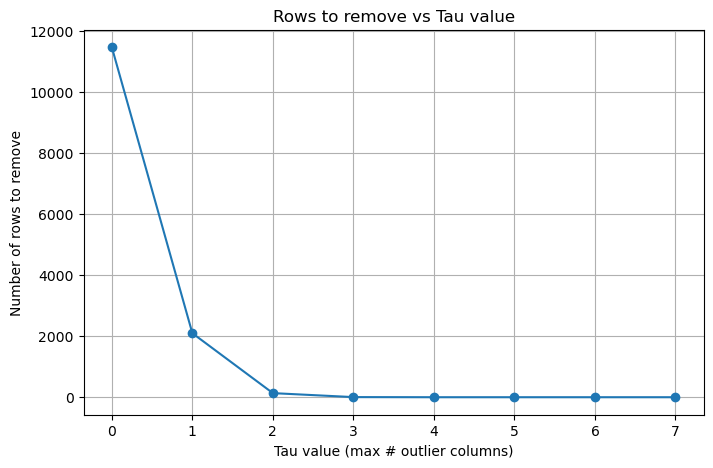

Chosen row-level outlier threshold (tau): 2
Number of rows to remove: 134
Shape after outlier removal: (21745, 7)


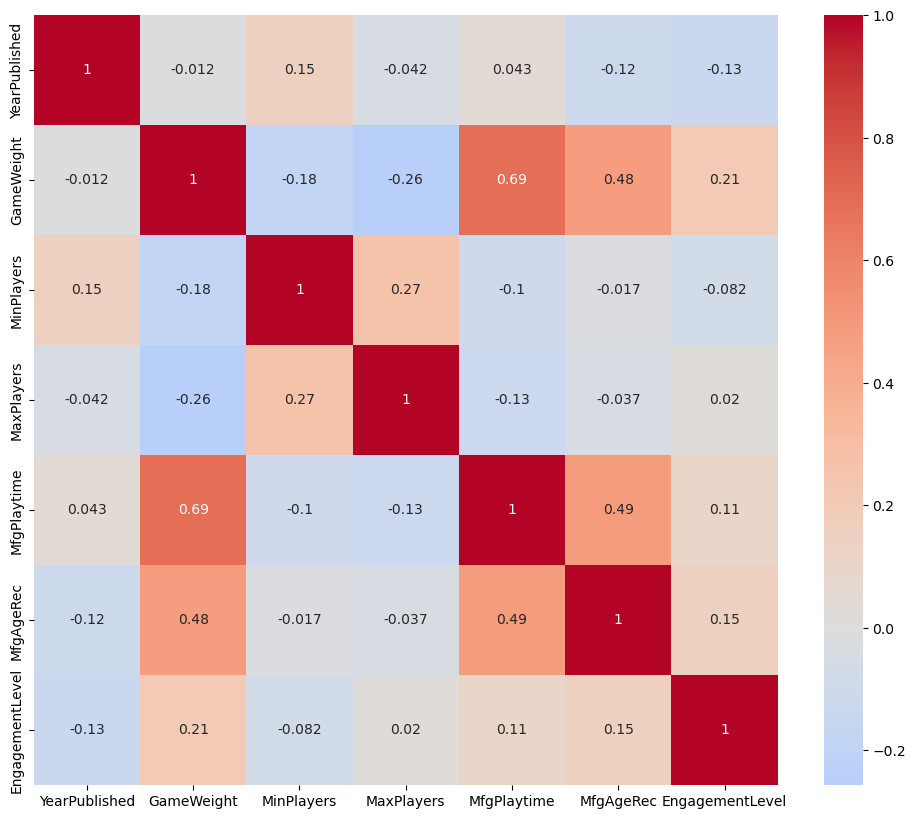

In [3]:
# 1. Select numeric columns
df_num = df.select_dtypes(include=["float64", "int64"])

# Remove binaries and Rank columns
numeric_cols = [col for col in df_num.columns 
                if df_num[col].nunique() > 2 and 'Rank' not in col]
df_num = df_num[numeric_cols].copy()

# 2. Fix YearPublished (recency)
if 'YearPublished' in df_num.columns:
    df_num['YearPublished'] = df_num['YearPublished'].max() - df_num['YearPublished']

# 3. Exclude columns with high zero values
zero_threshold = 0.5
cols_to_exclude = [col for col in df_num.columns 
                   if (df_num[col] == 0).mean() > zero_threshold]
df_num.drop(columns=cols_to_exclude, inplace=True)
print("Excluded columns due to high zero values:", cols_to_exclude)

# Log transform skewed columns except EngagementLevel
skewed_cols = df_num.skew().abs()
log_cols = skewed_cols[(skewed_cols >= 1.0) | (skewed_cols <= -1.0)].index.tolist()
log_cols = [c for c in log_cols if c != 'EngagementLevel']

df_num[log_cols] = df_num[log_cols].apply(np.log1p)
print("Log-transforming columns:", log_cols)

# 4. IQR-based row-level outlier detection on selected columns
cols_for_outliers = [
    'YearPublished', 'GameWeight', 'MinPlayers',
    'MaxPlayers', 'MfgPlaytime', 'MfgAgeRec', 'EngagementLevel'
]

# tieni solo quelle effettivamente presenti in df_num
cols_for_outliers = [c for c in cols_for_outliers if c in df_num.columns]
print("Columns used for IQR-based row outlier detection:", cols_for_outliers)

outlier_flags = pd.DataFrame(index=df_num.index)

for col in cols_for_outliers:
    q1 = df_num[col].quantile(0.25)
    q3 = df_num[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    outlier_flags[col] = (
        (df_num[col] < lower_bound) | (df_num[col] > upper_bound)
    ).astype(int)

# Ri = numero di outlier per riga
Ri = outlier_flags.sum(axis=1)

# Plot: numero di righe eliminate al variare di tau
tau_values = np.arange(0, len(cols_for_outliers) + 1)
rows_to_drop_counts = [(Ri > tau).sum() for tau in tau_values]

plt.figure(figsize=(8, 5))
plt.plot(tau_values, rows_to_drop_counts, marker='o')
plt.xlabel('Tau value (max # outlier columns)')
plt.ylabel('Number of rows to remove')
plt.title('Rows to remove vs Tau value')
plt.grid(True)
plt.show()

tau = 2  # ad esempio: max 2 colonne outlier consentite
print(f"Chosen row-level outlier threshold (tau): {tau}")

rows_to_drop = Ri[Ri > tau].index
print(f"Number of rows to remove: {len(rows_to_drop)}")

# Rimuovi le righe outlier
df_filtered = df_num.drop(index=rows_to_drop).reset_index(drop=True)
print("Shape after outlier removal:", df_filtered.shape)

# 5. Standardize AFTER outlier removal
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_filtered)
X_filtered = X_scaled   # alias se ti serve lo stesso nome in altri pezzi di codice

# 6. Correlation Matrix
plt.figure(figsize=(12, 10))
sns.heatmap(df_filtered.corr(), cmap='coolwarm', center=0, annot=True)
plt.show()

In [4]:
#removing the same outliers from the original dataframe
df_cleaned = df.drop(index=rows_to_drop).reset_index(drop=True)
print("Shape of original dataframe after outlier removal:", df_cleaned.shape)

Shape of original dataframe after outlier removal: (21745, 17)


## Ward Linkage Method

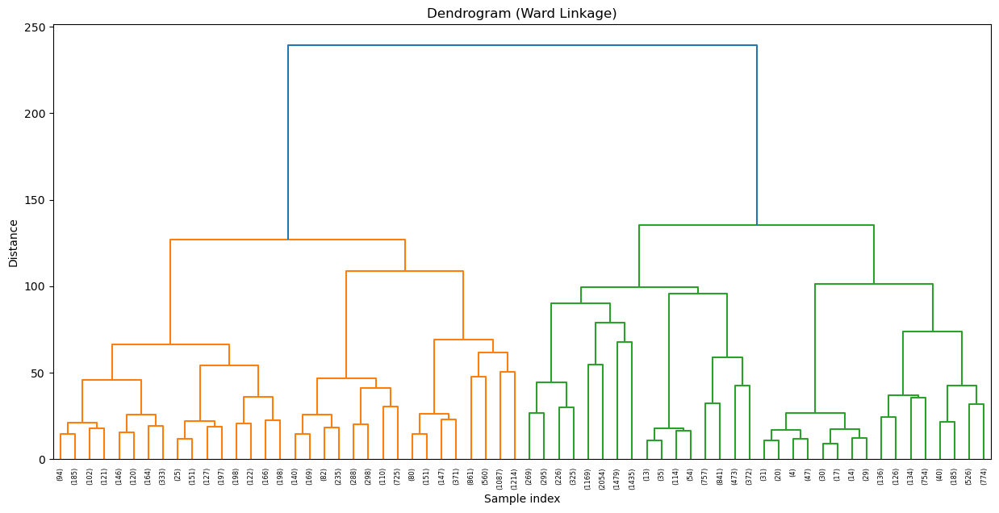

In [5]:
#creating the dendrogram with ward linkage method
from scipy.cluster.hierarchy import linkage, dendrogram
Z_ward = linkage(X_filtered, method='ward')
plt.figure(figsize=(15, 7))
dendrogram(Z_ward, truncate_mode='level', p=5)
plt.title('Dendrogram (Ward Linkage)')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()

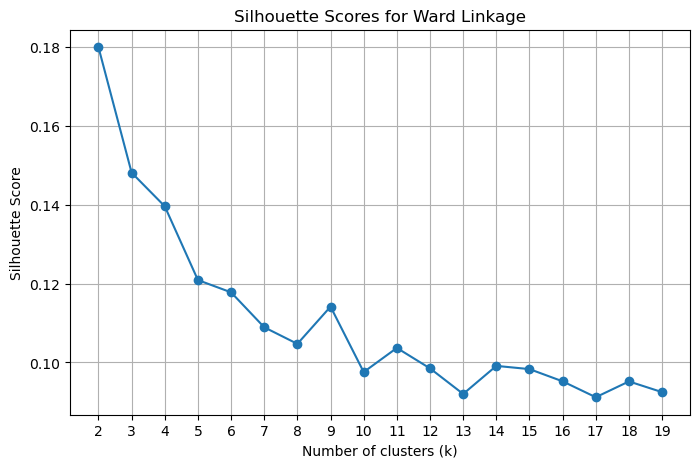

In [8]:
#plotting the silhouette scores for k from 2 to 10 for ward linkage, including on the x axis only integer values
from sklearn.metrics import silhouette_score
silhouette_scores = []
k_values = range(2, 20)
for k in k_values:
    cluster_labels = fcluster(Z_ward, k, criterion='maxclust')
    score = silhouette_score(X_filtered, cluster_labels)
    silhouette_scores.append(score)
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o')
plt.xticks(k_values)
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores for Ward Linkage')
plt.grid(True)
plt.show()

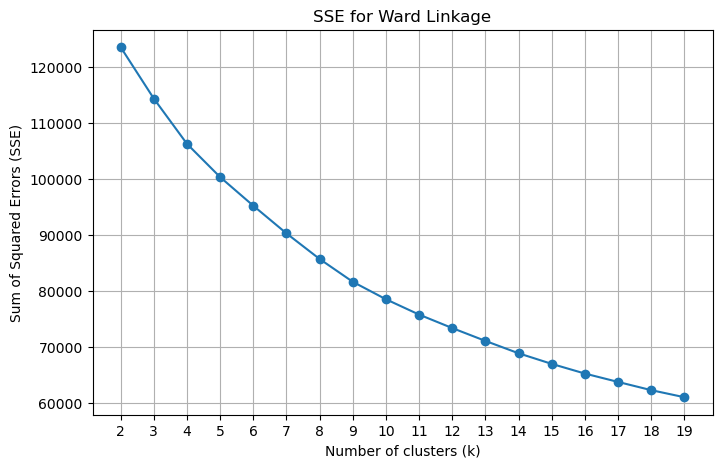

In [9]:
#SSE analysis for k from 2 to 20 for ward linkage
sse_values = []
k_values = range(2, 20)
for k in k_values:
    cluster_labels = fcluster(Z_ward, k, criterion='maxclust')
    sse = 0
    for cluster in np.unique(cluster_labels):
        cluster_points = X_filtered[cluster_labels == cluster]
        centroid = cluster_points.mean(axis=0)
        sse += ((cluster_points - centroid) ** 2).sum()
    sse_values.append(sse)
plt.figure(figsize=(8, 5))
plt.plot(k_values, sse_values, marker='o')
plt.xticks(k_values)
plt.xlabel('Number of clusters (k)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.title('SSE for Ward Linkage')
plt.grid(True)
plt.show()


Ward profiling for k=2
SSE=123551.29 | Silhouette=0.1799
Cluster sizes: {0: 8967, 1: 12778}

Numeric medians (selected):


,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,2.61,2.0,4.0,90.0,12.0,4.95,2012.0,8967,41.24
1,1.50,2.0,5.0,30.0,8.0,4.16,2011.0,12778,58.76


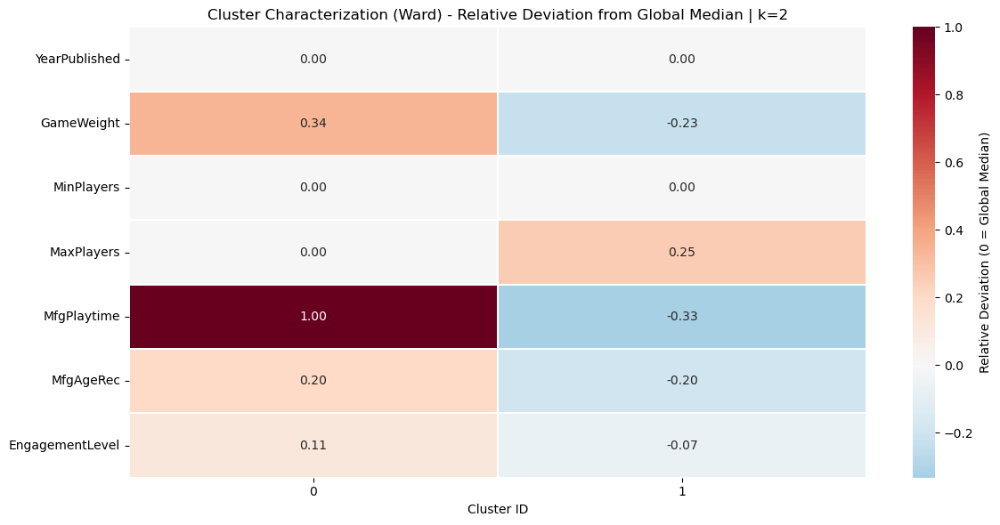


Binary variables (% of 1s):


,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,35.45,20.91,13.37
1,26.44,11.40,10.21



Category distribution (% within cluster):


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,1.97,1.72,0.04,5.78,34.01,0.55,14.92,9.14,31.86
1,7.04,1.15,6.83,10.14,63.42,4.45,1.58,2.11,3.28



Per-cluster external snapshots:

Cluster 0: Number of items = 8967
  HasFamily distribution (%):
HasFamily
0    64.55
1    35.45
Name: proportion, dtype: float64
  Category distribution (%):
Category
NoCategory    34.01
War           31.86
Strategy      14.92
Thematic       9.14
Family         5.78
Abstract       1.97
CGS            1.72
Party          0.55
Childrens      0.04
Name: proportion, dtype: float64
  Rating distribution (%):
Rating
Medium    46.78
High      39.39
Low       13.83
Name: proportion, dtype: float64
  Kickstarted distribution (%):
Kickstarted
0    79.09
1    20.91
Name: proportion, dtype: float64
  IsReimplementation distribution (%):
IsReimplementation
0    86.63
1    13.37
Name: proportion, dtype: float64
  Median Rank: 1943.0
  Median NumImplementations: 0.0
  Median NumExpansions: 0.0
  Median NumAlternates: 0.0

Cluster 1: Number of items = 12778
  HasFamily distribution (%):
HasFamily
0    73.56
1    26.44
Name: proportion, dtype: float64
  Category distri

,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,2.61,2.0,4.0,90.0,12.0,4.95,2012.0,8967,41.24
1,1.50,2.0,4.0,30.0,8.0,4.20,2010.0,9911,45.58
2,1.50,3.0,6.0,40.0,10.0,4.02,2013.0,2867,13.18


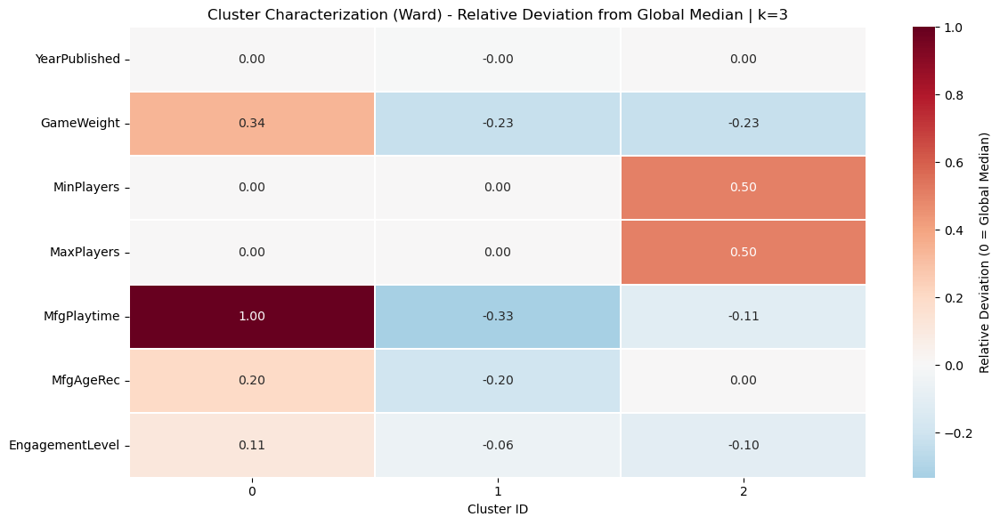


Binary variables (% of 1s):


,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,35.45,20.91,13.37
1,28.07,10.56,10.25
2,20.79,14.30,10.05



Category distribution (% within cluster):


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,1.97,1.72,0.04,5.78,34.01,0.55,14.92,9.14,31.86
1,8.90,1.42,8.36,11.91,57.56,3.82,1.76,2.37,3.89
2,0.59,0.21,1.53,4.05,83.68,6.63,0.98,1.19,1.15



Per-cluster external snapshots:

Cluster 0: Number of items = 8967
  HasFamily distribution (%):
HasFamily
0    64.55
1    35.45
Name: proportion, dtype: float64
  Category distribution (%):
Category
NoCategory    34.01
War           31.86
Strategy      14.92
Thematic       9.14
Family         5.78
Abstract       1.97
CGS            1.72
Party          0.55
Childrens      0.04
Name: proportion, dtype: float64
  Rating distribution (%):
Rating
Medium    46.78
High      39.39
Low       13.83
Name: proportion, dtype: float64
  Kickstarted distribution (%):
Kickstarted
0    79.09
1    20.91
Name: proportion, dtype: float64
  IsReimplementation distribution (%):
IsReimplementation
0    86.63
1    13.37
Name: proportion, dtype: float64
  Median Rank: 1943.0
  Median NumImplementations: 0.0
  Median NumExpansions: 0.0
  Median NumAlternates: 0.0

Cluster 1: Number of items = 9911
  HasFamily distribution (%):
HasFamily
0    71.93
1    28.07
Name: proportion, dtype: float64
  Category distrib

,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,2.56,1.0,4.0,90.0,12.0,4.98,2016.0,2449,11.26
1,2.64,2.0,4.0,90.0,12.0,4.94,2011.0,6518,29.97
2,1.50,2.0,4.0,30.0,8.0,4.20,2010.0,9911,45.58
3,1.50,3.0,6.0,40.0,10.0,4.02,2013.0,2867,13.18


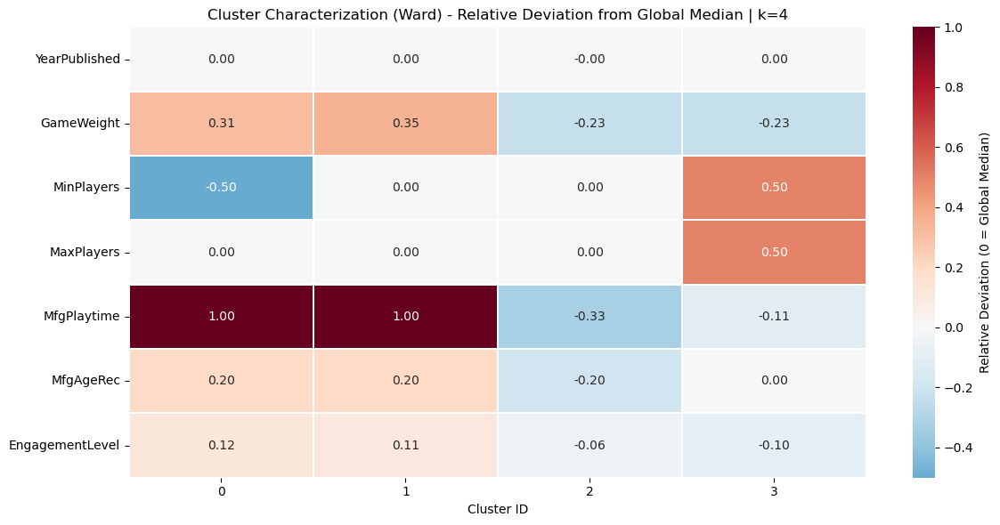


Binary variables (% of 1s):


,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,37.12,33.48,12.70
1,34.83,16.19,13.62
2,28.07,10.56,10.25
3,20.79,14.30,10.05



Category distribution (% within cluster):


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.94,0.78,0.00,2.78,41.53,0.16,11.19,13.52,29.11
1,2.36,2.07,0.06,6.90,31.19,0.69,16.32,7.50,32.89
2,8.90,1.42,8.36,11.91,57.56,3.82,1.76,2.37,3.89
3,0.59,0.21,1.53,4.05,83.68,6.63,0.98,1.19,1.15



Per-cluster external snapshots:

Cluster 0: Number of items = 2449
  HasFamily distribution (%):
HasFamily
0    62.88
1    37.12
Name: proportion, dtype: float64
  Category distribution (%):
Category
NoCategory    41.53
War           29.11
Thematic      13.52
Strategy      11.19
Family         2.78
Abstract       0.94
CGS            0.78
Party          0.16
Name: proportion, dtype: float64
  Rating distribution (%):
Rating
High      51.82
Medium    39.36
Low        8.82
Name: proportion, dtype: float64
  Kickstarted distribution (%):
Kickstarted
0    66.52
1    33.48
Name: proportion, dtype: float64
  IsReimplementation distribution (%):
IsReimplementation
0    87.3
1    12.7
Name: proportion, dtype: float64
  Median Rank: 2278.0
  Median NumImplementations: 0.0
  Median NumExpansions: 0.0
  Median NumAlternates: 0.0

Cluster 1: Number of items = 6518
  HasFamily distribution (%):
HasFamily
0    65.17
1    34.83
Name: proportion, dtype: float64
  Category distribution (%):
Category
Wa

,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,2.56,1.0,4.0,90.0,12.0,4.98,2016.0,2449,11.26
1,3.00,2.0,2.0,180.0,12.0,4.05,1994.0,2047,9.41
2,2.49,2.0,4.0,60.0,12.0,5.47,2014.0,4471,20.56
3,1.50,2.0,4.0,30.0,8.0,4.20,2010.0,9911,45.58
4,1.50,3.0,6.0,40.0,10.0,4.02,2013.0,2867,13.18


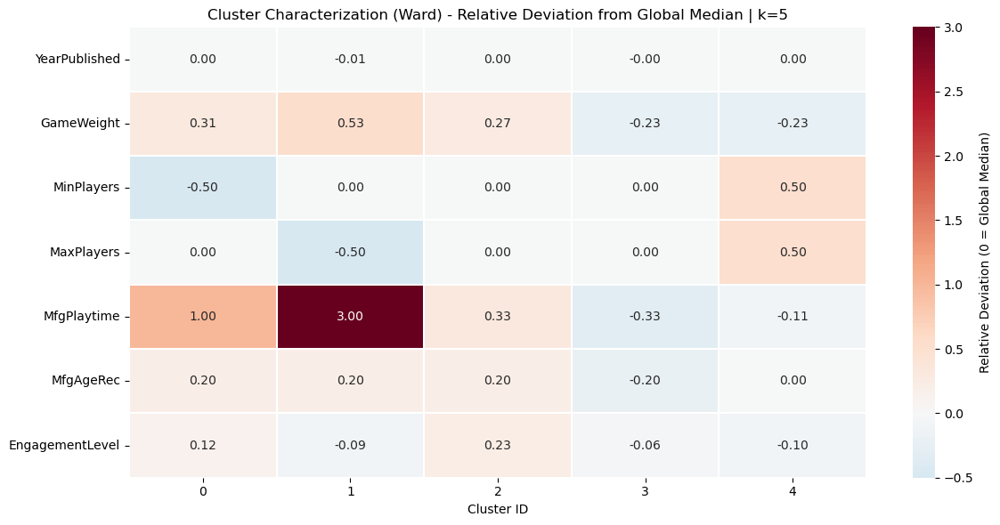


Binary variables (% of 1s):


,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,37.12,33.48,12.70
1,41.96,1.91,9.53
2,31.56,22.72,15.50
3,28.07,10.56,10.25
4,20.79,14.30,10.05



Category distribution (% within cluster):


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.94,0.78,0.00,2.78,41.53,0.16,11.19,13.52,29.11
1,2.10,0.78,0.05,0.05,10.80,0.00,4.49,2.34,79.38
2,2.48,2.66,0.07,10.04,40.53,1.01,21.74,9.86,11.61
3,8.90,1.42,8.36,11.91,57.56,3.82,1.76,2.37,3.89
4,0.59,0.21,1.53,4.05,83.68,6.63,0.98,1.19,1.15



Per-cluster external snapshots:

Cluster 0: Number of items = 2449
  HasFamily distribution (%):
HasFamily
0    62.88
1    37.12
Name: proportion, dtype: float64
  Category distribution (%):
Category
NoCategory    41.53
War           29.11
Thematic      13.52
Strategy      11.19
Family         2.78
Abstract       0.94
CGS            0.78
Party          0.16
Name: proportion, dtype: float64
  Rating distribution (%):
Rating
High      51.82
Medium    39.36
Low        8.82
Name: proportion, dtype: float64
  Kickstarted distribution (%):
Kickstarted
0    66.52
1    33.48
Name: proportion, dtype: float64
  IsReimplementation distribution (%):
IsReimplementation
0    87.3
1    12.7
Name: proportion, dtype: float64
  Median Rank: 2278.0
  Median NumImplementations: 0.0
  Median NumExpansions: 0.0
  Median NumAlternates: 0.0

Cluster 1: Number of items = 2047
  HasFamily distribution (%):
HasFamily
0    58.04
1    41.96
Name: proportion, dtype: float64
  Category distribution (%):
Category
Wa

,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,2.56,1.0,4.0,90.0,12.0,4.98,2016.0,2449,11.26
1,3.00,2.0,2.0,180.0,12.0,4.05,1994.0,2047,9.41
2,2.49,2.0,4.0,60.0,12.0,5.47,2014.0,4471,20.56
3,1.50,2.0,4.0,30.0,8.0,4.20,2010.0,9911,45.58
4,1.28,2.0,99.0,30.0,10.0,4.23,2014.0,192,0.88
5,1.50,3.0,6.0,40.0,10.0,4.00,2013.0,2675,12.30


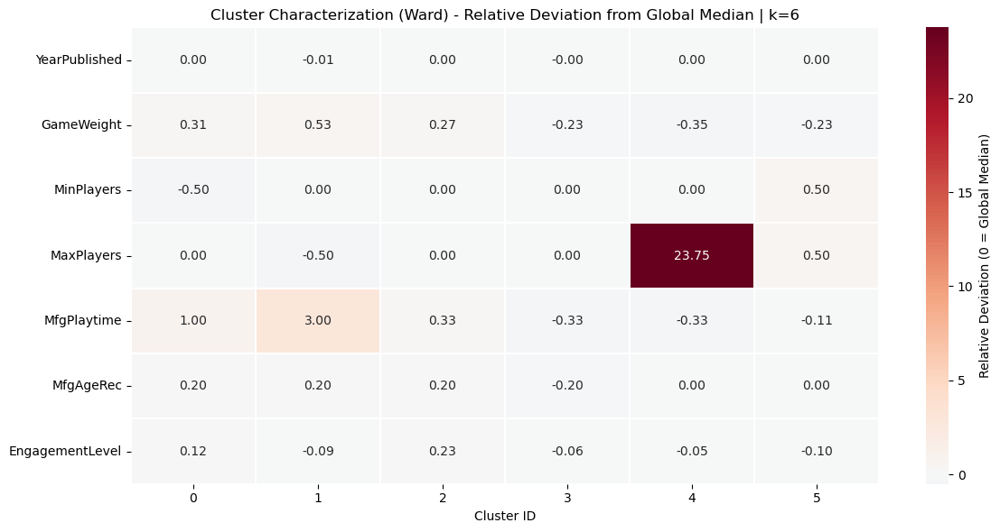


Binary variables (% of 1s):


,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,37.12,33.48,12.70
1,41.96,1.91,9.53
2,31.56,22.72,15.50
3,28.07,10.56,10.25
4,38.02,6.25,14.06
5,19.55,14.88,9.76



Category distribution (% within cluster):


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.94,0.78,0.00,2.78,41.53,0.16,11.19,13.52,29.11
1,2.10,0.78,0.05,0.05,10.80,0.00,4.49,2.34,79.38
2,2.48,2.66,0.07,10.04,40.53,1.01,21.74,9.86,11.61
3,8.90,1.42,8.36,11.91,57.56,3.82,1.76,2.37,3.89
4,0.00,1.04,2.60,3.12,70.83,13.02,0.52,1.04,7.81
5,0.64,0.15,1.46,4.11,84.60,6.17,1.01,1.20,0.67



Per-cluster external snapshots:

Cluster 0: Number of items = 2449
  HasFamily distribution (%):
HasFamily
0    62.88
1    37.12
Name: proportion, dtype: float64
  Category distribution (%):
Category
NoCategory    41.53
War           29.11
Thematic      13.52
Strategy      11.19
Family         2.78
Abstract       0.94
CGS            0.78
Party          0.16
Name: proportion, dtype: float64
  Rating distribution (%):
Rating
High      51.82
Medium    39.36
Low        8.82
Name: proportion, dtype: float64
  Kickstarted distribution (%):
Kickstarted
0    66.52
1    33.48
Name: proportion, dtype: float64
  IsReimplementation distribution (%):
IsReimplementation
0    87.3
1    12.7
Name: proportion, dtype: float64
  Median Rank: 2278.0
  Median NumImplementations: 0.0
  Median NumExpansions: 0.0
  Median NumAlternates: 0.0

Cluster 1: Number of items = 2047
  HasFamily distribution (%):
HasFamily
0    58.04
1    41.96
Name: proportion, dtype: float64
  Category distribution (%):
Category
Wa

,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,2.56,1.0,4.0,90.0,12.0,4.98,2016.0,2449,11.26
1,3.00,2.0,2.0,180.0,12.0,4.05,1994.0,2047,9.41
2,2.49,2.0,4.0,60.0,12.0,5.47,2014.0,4471,20.56
3,1.50,2.0,4.0,30.0,8.0,3.85,2010.0,7252,33.35
4,1.44,2.0,5.0,30.0,8.0,5.80,2008.0,2659,12.23
5,1.28,2.0,99.0,30.0,10.0,4.23,2014.0,192,0.88
6,1.50,3.0,6.0,40.0,10.0,4.00,2013.0,2675,12.30


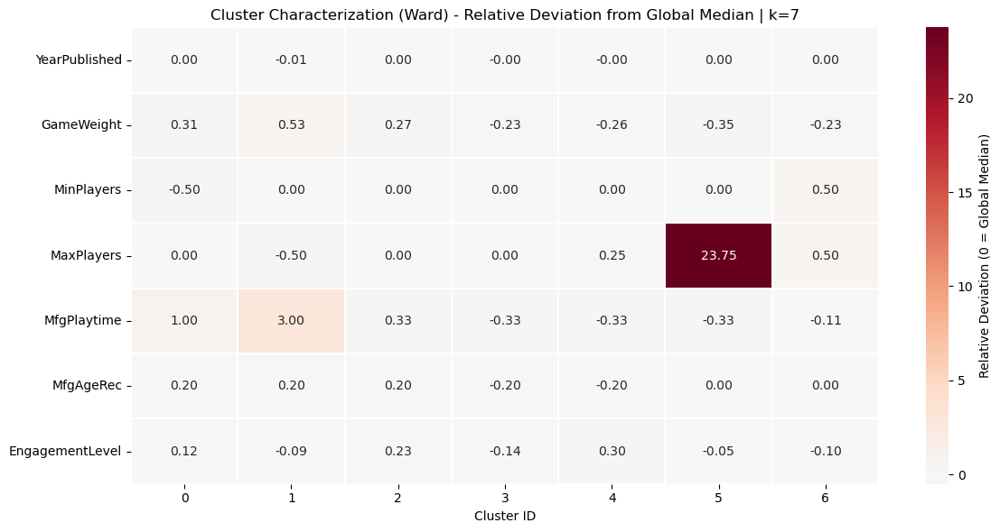


Binary variables (% of 1s):


,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,37.12,33.48,12.70
1,41.96,1.91,9.53
2,31.56,22.72,15.50
3,24.45,11.28,8.98
4,37.95,8.61,13.73
5,38.02,6.25,14.06
6,19.55,14.88,9.76



Category distribution (% within cluster):


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.94,0.78,0.00,2.78,41.53,0.16,11.19,13.52,29.11
1,2.10,0.78,0.05,0.05,10.80,0.00,4.49,2.34,79.38
2,2.48,2.66,0.07,10.04,40.53,1.01,21.74,9.86,11.61
3,9.29,1.72,7.74,5.06,67.58,0.65,1.02,1.86,5.07
4,7.82,0.60,10.08,30.58,30.24,12.49,3.76,3.76,0.68
5,0.00,1.04,2.60,3.12,70.83,13.02,0.52,1.04,7.81
6,0.64,0.15,1.46,4.11,84.60,6.17,1.01,1.20,0.67



Per-cluster external snapshots:

Cluster 0: Number of items = 2449
  HasFamily distribution (%):
HasFamily
0    62.88
1    37.12
Name: proportion, dtype: float64
  Category distribution (%):
Category
NoCategory    41.53
War           29.11
Thematic      13.52
Strategy      11.19
Family         2.78
Abstract       0.94
CGS            0.78
Party          0.16
Name: proportion, dtype: float64
  Rating distribution (%):
Rating
High      51.82
Medium    39.36
Low        8.82
Name: proportion, dtype: float64
  Kickstarted distribution (%):
Kickstarted
0    66.52
1    33.48
Name: proportion, dtype: float64
  IsReimplementation distribution (%):
IsReimplementation
0    87.3
1    12.7
Name: proportion, dtype: float64
  Median Rank: 2278.0
  Median NumImplementations: 0.0
  Median NumExpansions: 0.0
  Median NumAlternates: 0.0

Cluster 1: Number of items = 2047
  HasFamily distribution (%):
HasFamily
0    58.04
1    41.96
Name: proportion, dtype: float64
  Category distribution (%):
Category
Wa

,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,2.56,1.0,4.0,90.0,12.0,4.98,2016.0,2449,11.26
1,3.00,2.0,2.0,180.0,12.0,4.05,1994.0,2047,9.41
2,2.49,2.0,4.0,60.0,12.0,5.47,2014.0,4471,20.56
3,1.50,2.0,4.0,30.0,8.0,3.85,2010.0,7252,33.35
4,1.67,2.0,4.0,30.0,8.0,3.58,-0.0,216,0.99
5,1.43,2.0,5.0,30.0,8.0,5.94,2009.0,2443,11.23
6,1.28,2.0,99.0,30.0,10.0,4.23,2014.0,192,0.88
7,1.50,3.0,6.0,40.0,10.0,4.00,2013.0,2675,12.30


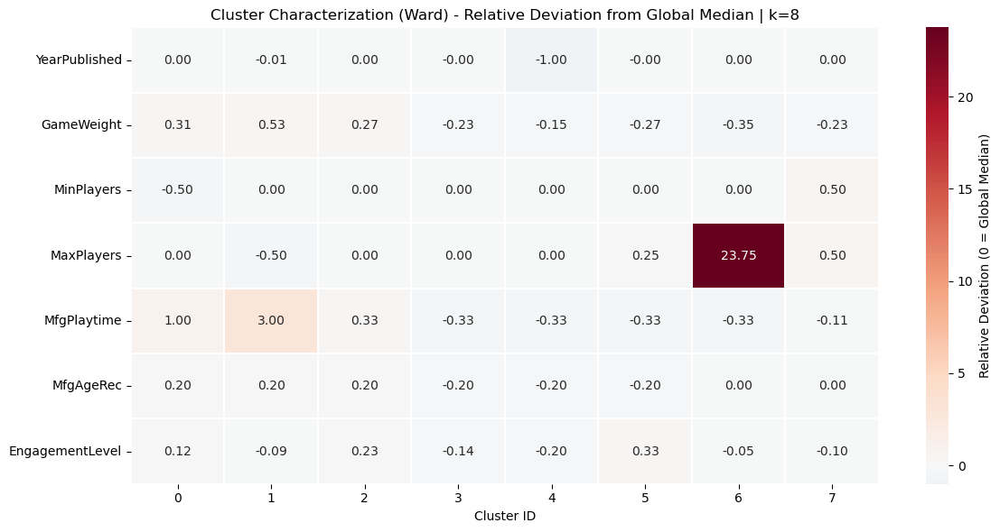


Binary variables (% of 1s):


,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,37.12,33.48,12.70
1,41.96,1.91,9.53
2,31.56,22.72,15.50
3,24.45,11.28,8.98
4,15.74,9.72,2.31
5,39.91,8.51,14.74
6,38.02,6.25,14.06
7,19.55,14.88,9.76



Category distribution (% within cluster):


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.94,0.78,0.00,2.78,41.53,0.16,11.19,13.52,29.11
1,2.10,0.78,0.05,0.05,10.80,0.00,4.49,2.34,79.38
2,2.48,2.66,0.07,10.04,40.53,1.01,21.74,9.86,11.61
3,9.29,1.72,7.74,5.06,67.58,0.65,1.02,1.86,5.07
4,25.46,0.00,6.02,2.78,60.19,2.78,0.46,0.00,2.31
5,6.26,0.65,10.44,33.03,27.59,13.34,4.05,4.09,0.53
6,0.00,1.04,2.60,3.12,70.83,13.02,0.52,1.04,7.81
7,0.64,0.15,1.46,4.11,84.60,6.17,1.01,1.20,0.67



Per-cluster external snapshots:

Cluster 0: Number of items = 2449
  HasFamily distribution (%):
HasFamily
0    62.88
1    37.12
Name: proportion, dtype: float64
  Category distribution (%):
Category
NoCategory    41.53
War           29.11
Thematic      13.52
Strategy      11.19
Family         2.78
Abstract       0.94
CGS            0.78
Party          0.16
Name: proportion, dtype: float64
  Rating distribution (%):
Rating
High      51.82
Medium    39.36
Low        8.82
Name: proportion, dtype: float64
  Kickstarted distribution (%):
Kickstarted
0    66.52
1    33.48
Name: proportion, dtype: float64
  IsReimplementation distribution (%):
IsReimplementation
0    87.3
1    12.7
Name: proportion, dtype: float64
  Median Rank: 2278.0
  Median NumImplementations: 0.0
  Median NumExpansions: 0.0
  Median NumAlternates: 0.0

Cluster 1: Number of items = 2047
  HasFamily distribution (%):
HasFamily
0    58.04
1    41.96
Name: proportion, dtype: float64
  Category distribution (%):
Category
Wa

,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,2.56,1.0,4.0,90.0,12.0,4.98,2016.0,2449,11.26
1,3.00,2.0,2.0,180.0,12.0,4.05,1994.0,2047,9.41
2,2.49,2.0,4.0,60.0,12.0,5.47,2014.0,4471,20.56
3,1.57,1.0,4.0,30.0,8.0,4.42,2016.0,1115,5.13
4,1.50,2.0,4.0,30.0,8.0,3.78,2009.0,6137,28.22
5,1.67,2.0,4.0,30.0,8.0,3.58,-0.0,216,0.99
6,1.43,2.0,5.0,30.0,8.0,5.94,2009.0,2443,11.23
7,1.28,2.0,99.0,30.0,10.0,4.23,2014.0,192,0.88
8,1.50,3.0,6.0,40.0,10.0,4.00,2013.0,2675,12.30


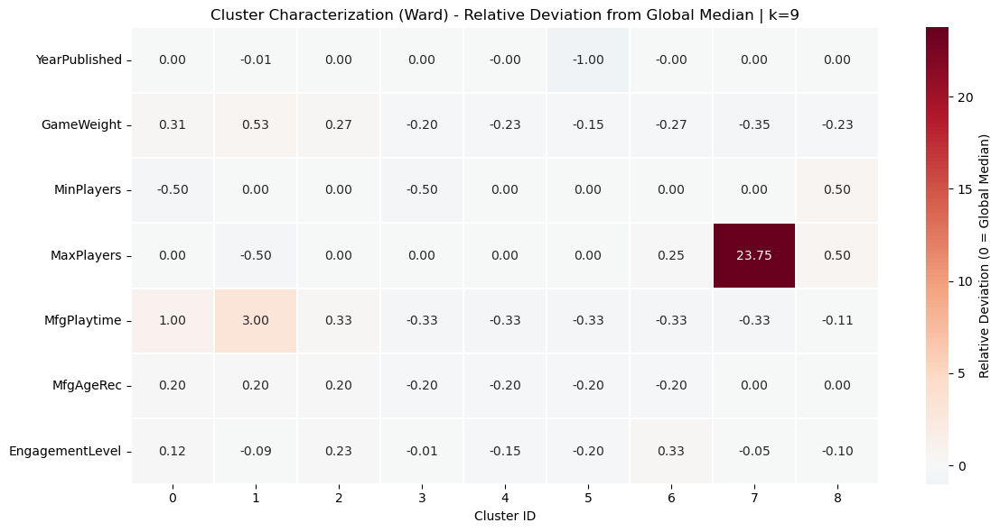


Binary variables (% of 1s):


,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,37.12,33.48,12.70
1,41.96,1.91,9.53
2,31.56,22.72,15.50
3,32.38,22.24,11.30
4,23.01,9.29,8.55
5,15.74,9.72,2.31
6,39.91,8.51,14.74
7,38.02,6.25,14.06
8,19.55,14.88,9.76



Category distribution (% within cluster):


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.94,0.78,0.00,2.78,41.53,0.16,11.19,13.52,29.11
1,2.10,0.78,0.05,0.05,10.80,0.00,4.49,2.34,79.38
2,2.48,2.66,0.07,10.04,40.53,1.01,21.74,9.86,11.61
3,6.64,0.36,7.09,13.90,62.69,1.35,2.15,3.86,1.97
4,9.78,1.97,7.85,3.45,68.47,0.52,0.81,1.50,5.64
5,25.46,0.00,6.02,2.78,60.19,2.78,0.46,0.00,2.31
6,6.26,0.65,10.44,33.03,27.59,13.34,4.05,4.09,0.53
7,0.00,1.04,2.60,3.12,70.83,13.02,0.52,1.04,7.81
8,0.64,0.15,1.46,4.11,84.60,6.17,1.01,1.20,0.67



Per-cluster external snapshots:

Cluster 0: Number of items = 2449
  HasFamily distribution (%):
HasFamily
0    62.88
1    37.12
Name: proportion, dtype: float64
  Category distribution (%):
Category
NoCategory    41.53
War           29.11
Thematic      13.52
Strategy      11.19
Family         2.78
Abstract       0.94
CGS            0.78
Party          0.16
Name: proportion, dtype: float64
  Rating distribution (%):
Rating
High      51.82
Medium    39.36
Low        8.82
Name: proportion, dtype: float64
  Kickstarted distribution (%):
Kickstarted
0    66.52
1    33.48
Name: proportion, dtype: float64
  IsReimplementation distribution (%):
IsReimplementation
0    87.3
1    12.7
Name: proportion, dtype: float64
  Median Rank: 2278.0
  Median NumImplementations: 0.0
  Median NumExpansions: 0.0
  Median NumAlternates: 0.0

Cluster 1: Number of items = 2047
  HasFamily distribution (%):
HasFamily
0    58.04
1    41.96
Name: proportion, dtype: float64
  Category distribution (%):
Category
Wa

,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,2.56,1.0,4.0,90.0,12.0,4.98,2016.0,2449,11.26
1,3.00,2.0,2.0,180.0,12.0,4.05,1994.0,2047,9.41
2,2.49,2.0,4.0,60.0,12.0,5.47,2014.0,4471,20.56
3,1.57,1.0,4.0,30.0,8.0,4.42,2016.0,1115,5.13
4,1.29,2.0,4.0,20.0,8.0,3.69,2014.0,3223,14.82
5,1.71,2.0,4.0,30.0,10.0,3.91,2003.0,2914,13.40
6,1.67,2.0,4.0,30.0,8.0,3.58,-0.0,216,0.99
7,1.43,2.0,5.0,30.0,8.0,5.94,2009.0,2443,11.23
8,1.28,2.0,99.0,30.0,10.0,4.23,2014.0,192,0.88


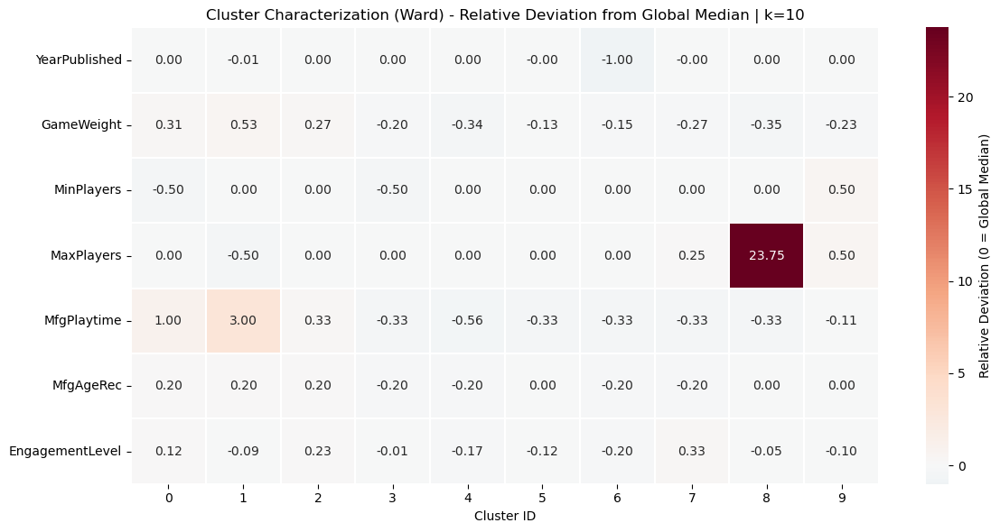


Binary variables (% of 1s):


,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,37.12,33.48,12.70
1,41.96,1.91,9.53
2,31.56,22.72,15.50
3,32.38,22.24,11.30
4,18.34,12.19,9.31
5,28.17,6.07,7.72
6,15.74,9.72,2.31
7,39.91,8.51,14.74
8,38.02,6.25,14.06



Category distribution (% within cluster):


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.94,0.78,0.00,2.78,41.53,0.16,11.19,13.52,29.11
1,2.10,0.78,0.05,0.05,10.80,0.00,4.49,2.34,79.38
2,2.48,2.66,0.07,10.04,40.53,1.01,21.74,9.86,11.61
3,6.64,0.36,7.09,13.90,62.69,1.35,2.15,3.86,1.97
4,5.09,0.50,11.36,2.33,79.15,0.34,0.16,0.25,0.84
5,14.96,3.60,3.98,4.70,56.66,0.72,1.54,2.88,10.95
6,25.46,0.00,6.02,2.78,60.19,2.78,0.46,0.00,2.31
7,6.26,0.65,10.44,33.03,27.59,13.34,4.05,4.09,0.53
8,0.00,1.04,2.60,3.12,70.83,13.02,0.52,1.04,7.81



Per-cluster external snapshots:

Cluster 0: Number of items = 2449
  HasFamily distribution (%):
HasFamily
0    62.88
1    37.12
Name: proportion, dtype: float64
  Category distribution (%):
Category
NoCategory    41.53
War           29.11
Thematic      13.52
Strategy      11.19
Family         2.78
Abstract       0.94
CGS            0.78
Party          0.16
Name: proportion, dtype: float64
  Rating distribution (%):
Rating
High      51.82
Medium    39.36
Low        8.82
Name: proportion, dtype: float64
  Kickstarted distribution (%):
Kickstarted
0    66.52
1    33.48
Name: proportion, dtype: float64
  IsReimplementation distribution (%):
IsReimplementation
0    87.3
1    12.7
Name: proportion, dtype: float64
  Median Rank: 2278.0
  Median NumImplementations: 0.0
  Median NumExpansions: 0.0
  Median NumAlternates: 0.0

Cluster 1: Number of items = 2047
  HasFamily distribution (%):
HasFamily
0    58.04
1    41.96
Name: proportion, dtype: float64
  Category distribution (%):
Category
Wa

,k,SSE,Silhouette,MinClusterSize,MaxClusterSize,NumClusters
0,2,123551.2931,0.1799,8967,12778,2
1,3,114374.1230,0.1481,2867,9911,3
2,4,106298.7929,0.1396,2449,9911,4
3,5,100367.9648,0.1209,2047,9911,5
4,6,95258.7735,0.1178,192,9911,6
5,7,90329.0288,0.1089,192,7252,7
6,8,85756.7102,0.1047,192,7252,8
7,9,81686.5835,0.1141,192,6137,9
8,10,78572.0041,0.0976,192,4471,10


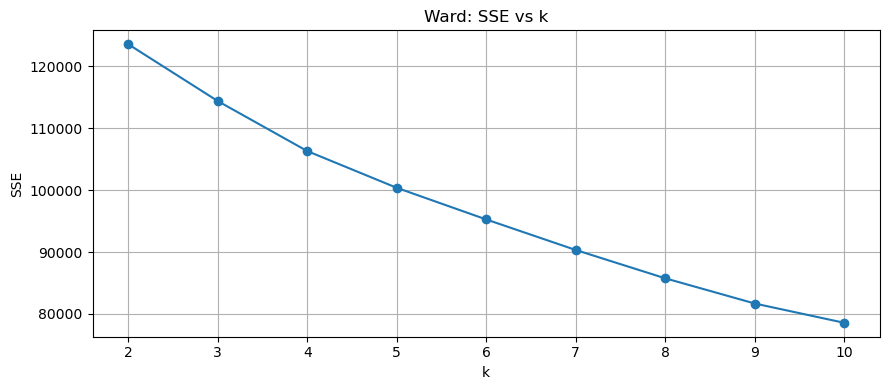

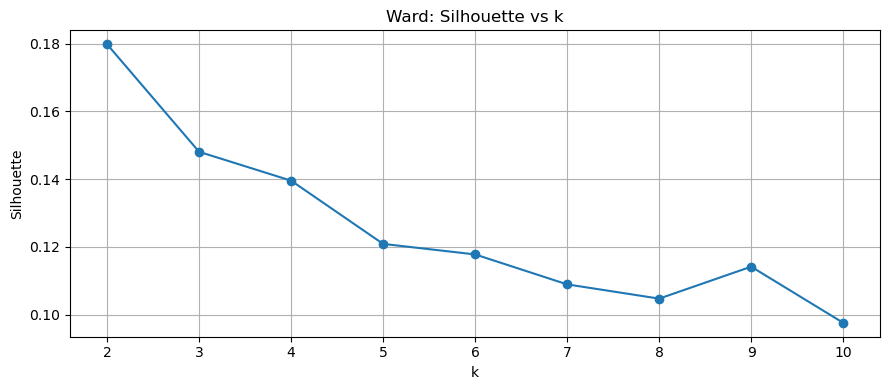

In [16]:
# Ward linkage: profiling output for k = 2..10 (NO overwriting of your existing variables)
# Uses your setup: df_filtered, X_scaled, df_cleaned, log_cols, df, and your Ward recency transform.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import silhouette_score


# ----------------------------
# 0) Configuration (edit if needed)
# ----------------------------
k_values_eval = list(range(2, 11))

# External variables to profile on ORIGINAL (cleaned) dataframe
binary_cols_eval = ["HasFamily", "Kickstarted", "IsReimplementation"]
category_col_eval = "Category"

# Numeric columns to show first in a compact summary (optional)
key_numeric_cols = [
    "GameWeight", "MinPlayers", "MaxPlayers", "MfgPlaytime", "MfgAgeRec", "EngagementLevel", "YearPublished"
]

# Extra columns to print per cluster from df_cleaned (mixture of categorical/binary/numeric/rank)
external_cols_to_print = [
    "HasFamily", "Category", "Rating", "Kickstarted", "IsReimplementation",
    "Rank", "NumImplementations", "NumExpansions", "NumAlternates"
]


# ----------------------------
# 1) Safety checks (do not overwrite anything)
# ----------------------------
required = ["df_filtered", "X_scaled", "df_cleaned", "df", "log_cols"]
missing = [v for v in required if v not in globals()]
if missing:
    raise NameError(f"Missing variables in memory: {missing}. "
                    "Expected from your setup: df_filtered, X_scaled, df_cleaned, df, log_cols.")

if len(df_filtered) != X_scaled.shape[0]:
    raise ValueError("Row mismatch: len(df_filtered) != X_scaled.shape[0]. They must be aligned.")

if len(df_cleaned) != X_scaled.shape[0]:
    raise ValueError("Row mismatch: len(df_cleaned) != X_scaled.shape[0]. "
                     "df_cleaned must be the original df with the same outliers removed.")

# If some external columns are missing, we’ll just skip them safely
external_cols_present = [c for c in external_cols_to_print if c in df_cleaned.columns]


# ----------------------------
# 2) Linkage once (Ward)
# ----------------------------
Z_ward_eval = linkage(X_scaled, method="ward", metric="euclidean")


# ----------------------------
# 3) Helper: invert transforms for readability (without touching your df_filtered)
# ----------------------------
def make_readable_numeric_profile(df_num_like: pd.DataFrame, log_cols_list: list[str]) -> pd.DataFrame:
    """
    Takes a numeric df (your df_num-style transformed space), returns a copy with:
      - expm1 inverse for log1p columns
      - YearPublished back to actual year (undo recency), using df['YearPublished'].max()
    """
    out = df_num_like.copy()

    # invert log
    for c in log_cols_list:
        if c in out.columns:
            out[c] = np.expm1(out[c])

    # undo recency -> year
    if "YearPublished" in out.columns and "YearPublished" in df.columns:
        out["YearPublished"] = df["YearPublished"].max() - out["YearPublished"]

    return out


# ----------------------------
# 4) Main loop: compute + print outputs for each k
# ----------------------------
ward_eval_results = {}  # new variable, doesn't overwrite anything

metrics_rows = []

for k in k_values_eval:
    labels_k = fcluster(Z_ward_eval, t=k, criterion="maxclust") - 1  # 0-based

    # Metrics
    sil_k = silhouette_score(X_scaled, labels_k, metric="euclidean")
    cluster_sizes_k = pd.Series(labels_k).value_counts().sort_index()
    sse_k = 0.0
    for c in np.unique(labels_k):
        Xc = X_scaled[labels_k == c]
        centroid = Xc.mean(axis=0)
        sse_k += ((Xc - centroid) ** 2).sum()
    sse_k = float(sse_k)

    metrics_rows.append({
        "k": k,
        "SSE": sse_k,
        "Silhouette": sil_k,
        "MinClusterSize": int(cluster_sizes_k.min()),
        "MaxClusterSize": int(cluster_sizes_k.max()),
        "NumClusters": int(cluster_sizes_k.shape[0]),
    })

    # ----------------------------
    # Numeric profiling (readable space)
    # ----------------------------
    # Start from df_filtered (already cleaned + post-log + recency + dropped cols)
    # Add labels, then invert transforms for interpretability
    df_num_profile_k = df_filtered.copy()
    df_num_profile_k["Cluster"] = labels_k

    # Keep only numeric columns for inversion (excluding Cluster)
    df_num_inv_k = make_readable_numeric_profile(
        df_num_profile_k.drop(columns=["Cluster"]),
        log_cols_list=log_cols
    )
    df_num_inv_k["Cluster"] = labels_k

    # Median-based summary (as in your code)
    cluster_medians_k = df_num_inv_k.groupby("Cluster").median(numeric_only=True)
    cluster_counts_k = df_num_inv_k["Cluster"].value_counts().sort_index()

    cluster_summary_k = cluster_medians_k.copy()
    cluster_summary_k["Count"] = cluster_counts_k
    cluster_summary_k["% Total"] = (cluster_counts_k / len(df_num_inv_k)) * 100

    # Relative deviation vs global median
    global_median_k = df_num_inv_k.drop(columns=["Cluster"]).median(numeric_only=True)
    # avoid division by 0 for relative deviations
    denom = global_median_k.replace(0, np.nan)
    relative_imp_k = (cluster_medians_k - global_median_k) / denom

    # ----------------------------
    # External profiling (binary + categories) on df_cleaned
    # ----------------------------
    df_ext_k = df_cleaned.copy()
    df_ext_k["Cluster"] = labels_k

    # Binary % of 1s
    binary_cols_present = [c for c in binary_cols_eval if c in df_ext_k.columns]
    binary_pct_k = (
        df_ext_k.groupby("Cluster")[binary_cols_present]
        .mean(numeric_only=True)
        .mul(100)
        if binary_cols_present else pd.DataFrame()
    )

    # Category distribution (%)
    if category_col_eval in df_ext_k.columns:
        cat_dist_k = (
            df_ext_k.groupby("Cluster")[category_col_eval]
            .value_counts(normalize=True)
            .mul(100)
            .rename("pct")
            .reset_index()
            .pivot(index="Cluster", columns=category_col_eval, values="pct")
            .fillna(0)
        )
    else:
        cat_dist_k = pd.DataFrame()

    # ----------------------------
    # Store results per k (structured, no prints lost)
    # ----------------------------
    ward_eval_results[k] = {
        "labels": labels_k,
        "cluster_sizes": cluster_sizes_k,
        "cluster_summary_medians": cluster_summary_k,
        "relative_importance": relative_imp_k,
        "binary_pct": binary_pct_k,
        "category_dist_pct": cat_dist_k,
    }

    # ----------------------------
    # Print compact output per k
    # ----------------------------
    print("\n" + "=" * 90)
    print(f"Ward profiling for k={k}")
    print(f"SSE={sse_k:.2f} | Silhouette={sil_k:.4f}")
    print("Cluster sizes:", cluster_sizes_k.to_dict())

    # Numeric: show key columns if present
    key_cols_present = [c for c in key_numeric_cols if c in cluster_summary_k.columns]
    if key_cols_present:
        print("\nNumeric medians (selected):")
        display(cluster_summary_k[key_cols_present + ["Count", "% Total"]].round(2))
    else:
        print("\nNumeric medians (full, transposed):")
        display(cluster_summary_k.T.round(2))

    # Heatmap (relative deviations)
    # --- Heatmap con numeri + gestione NaN ---
    relative_imp_plot = relative_imp_k.copy()

    # Opzione A: mostra NaN come 0 (più leggibile)
    relative_imp_plot = relative_imp_plot.fillna(0)

    plt.figure(figsize=(12, 6))
    sns.heatmap(
        data=relative_imp_plot.T,
        cmap="RdBu_r",
        center=0,
        annot=True,
        fmt=".2f",
        cbar_kws={"label": "Relative Deviation (0 = Global Median)"},
        linewidths=0.2,
        linecolor="white"
    )
    plt.title(f"Cluster Characterization (Ward) - Relative Deviation from Global Median | k={k}")
    plt.xlabel("Cluster ID")
    plt.tight_layout()
    plt.show()


    # External: binary %
    if not binary_pct_k.empty:
        print("\nBinary variables (% of 1s):")
        display(binary_pct_k.round(2))

    # External: category distribution
    if not cat_dist_k.empty:
        print("\nCategory distribution (% within cluster):")
        display(cat_dist_k.round(2))

    # Optional: per-cluster detailed printout for selected external columns
    print("\nPer-cluster external snapshots:")
    for c in np.unique(labels_k):
        cluster_data_c = df_ext_k[df_ext_k["Cluster"] == c]
        print(f"\nCluster {c}: Number of items = {len(cluster_data_c)}")

        for col in external_cols_present:
            if col not in cluster_data_c.columns:
                continue

            if col in ["Rank", "NumImplementations", "NumExpansions", "NumAlternates"]:
                # numeric snapshot: median
                med_val = cluster_data_c[col].median()
                print(f"  Median {col}: {med_val}")
            elif col == category_col_eval:
                # categorical distribution
                vc = cluster_data_c[col].value_counts(normalize=True).mul(100).round(2)
                print(f"  {col} distribution (%):")
                print(vc.head(15))  # avoid huge dumps
                if len(vc) > 15:
                    print("  ... (truncated)")
            else:
                # binary distribution (or any low-cardinality)
                vc = cluster_data_c[col].value_counts(normalize=True).mul(100).round(2)
                print(f"  {col} distribution (%):")
                print(vc)

# Final metrics table
ward_metrics_df = pd.DataFrame(metrics_rows).sort_values("k").reset_index(drop=True)

print("\n" + "=" * 90)
print("Ward metrics across k:")
display(ward_metrics_df.round(4))

# Optional: quick plots (SSE and Silhouette vs k)
plt.figure(figsize=(9, 4))
plt.plot(ward_metrics_df["k"], ward_metrics_df["SSE"], marker="o")
plt.xlabel("k")
plt.ylabel("SSE")
plt.title("Ward: SSE vs k")
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(9, 4))
plt.plot(ward_metrics_df["k"], ward_metrics_df["Silhouette"], marker="o")
plt.xlabel("k")
plt.ylabel("Silhouette")
plt.title("Ward: Silhouette vs k")
plt.grid(True)
plt.tight_layout()
plt.show()


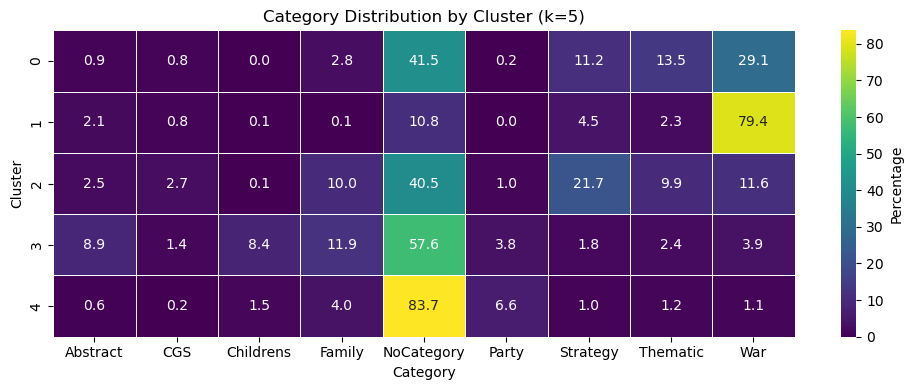

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Manually recreate the table using the reported values
data = {
    "Abstract":   [0.94, 2.10, 2.48, 8.90, 0.59],
    "CGS":        [0.78, 0.78, 2.66, 1.42, 0.21],
    "Childrens":  [0.00, 0.05, 0.07, 8.36, 1.53],
    "Family":     [2.78, 0.05, 10.04, 11.91, 4.05],
    "NoCategory": [41.53, 10.80, 40.53, 57.56, 83.68],
    "Party":      [0.16, 0.00, 1.01, 3.82, 6.63],
    "Strategy":   [11.19, 4.49, 21.74, 1.76, 0.98],
    "Thematic":   [13.52, 2.34, 9.86, 2.37, 1.19],
    "War":        [29.11, 79.38, 11.61, 3.89, 1.15],
}

df_heatmap = pd.DataFrame(data, index=[0, 1, 2, 3, 4])
df_heatmap.index.name = "Cluster"

# Plot heatmap
plt.figure(figsize=(10, 4))
sns.heatmap(
    df_heatmap,
    annot=True,
    fmt=".1f",
    cmap="viridis",
    linewidths=0.5,
    cbar_kws={"label": "Percentage"}
)

plt.xlabel("Category")
plt.ylabel("Cluster")
plt.title("Category Distribution by Cluster (k=5)")
plt.tight_layout()
plt.show()


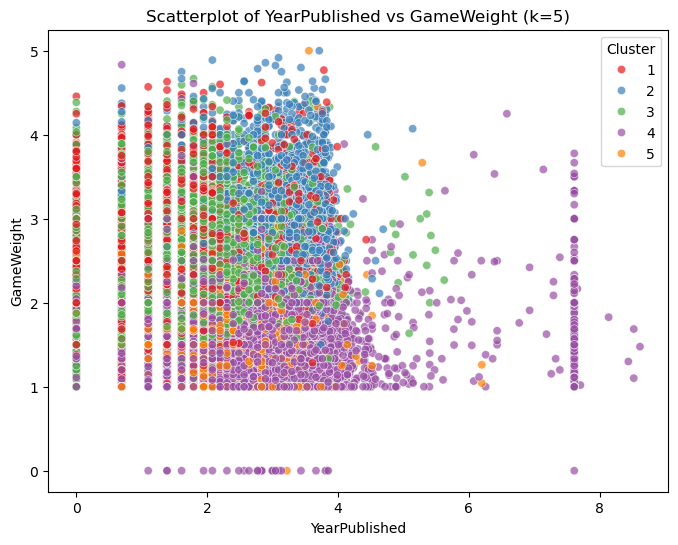

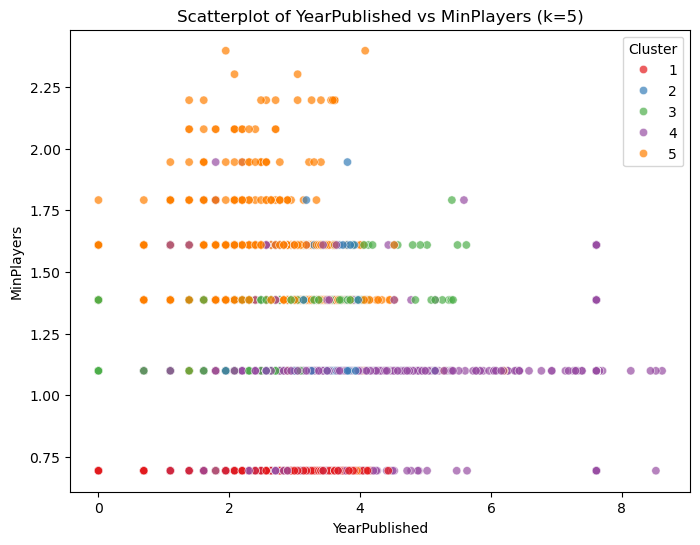

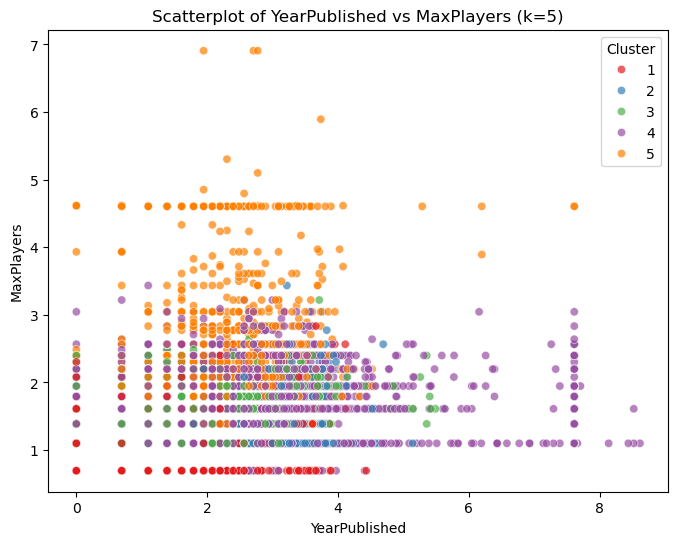

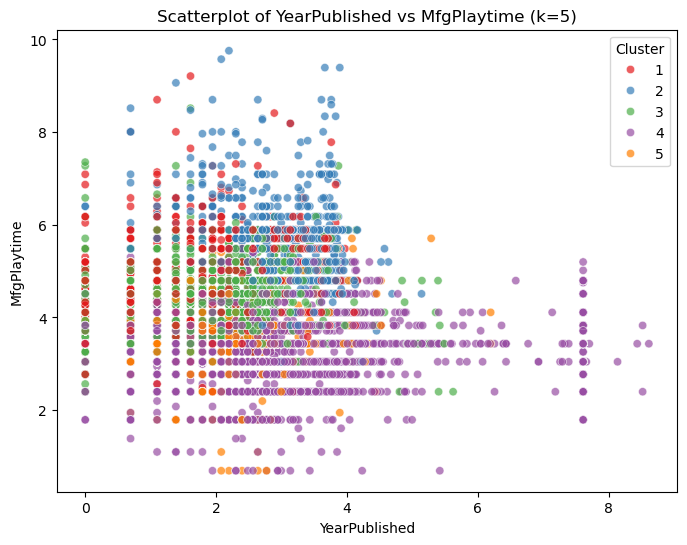

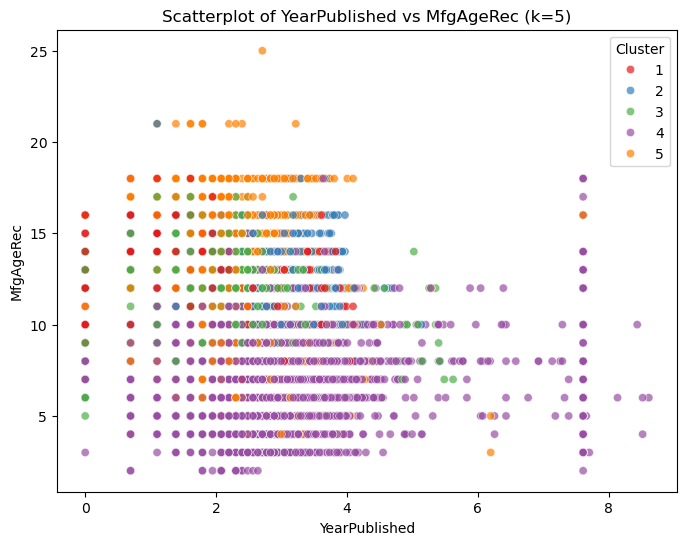

...

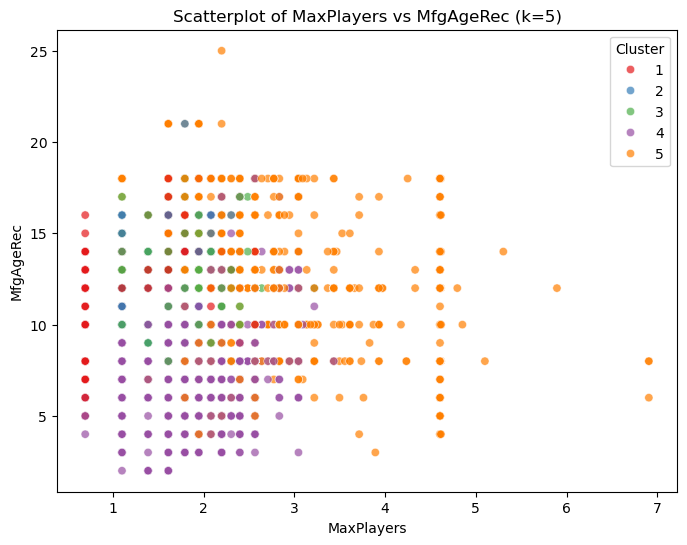

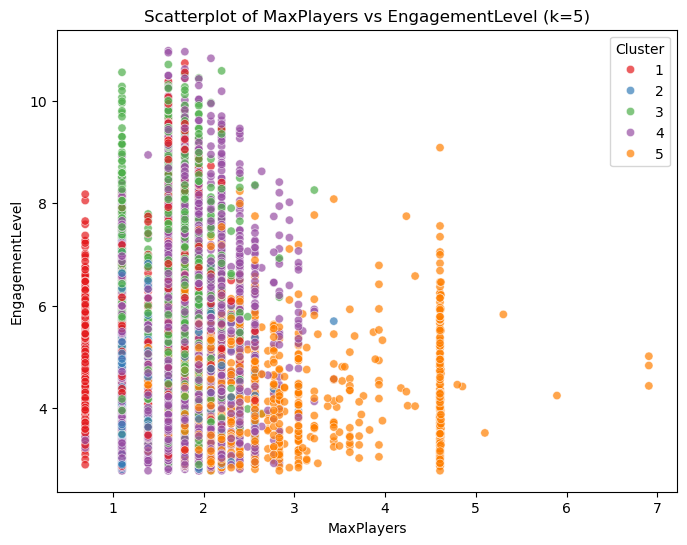

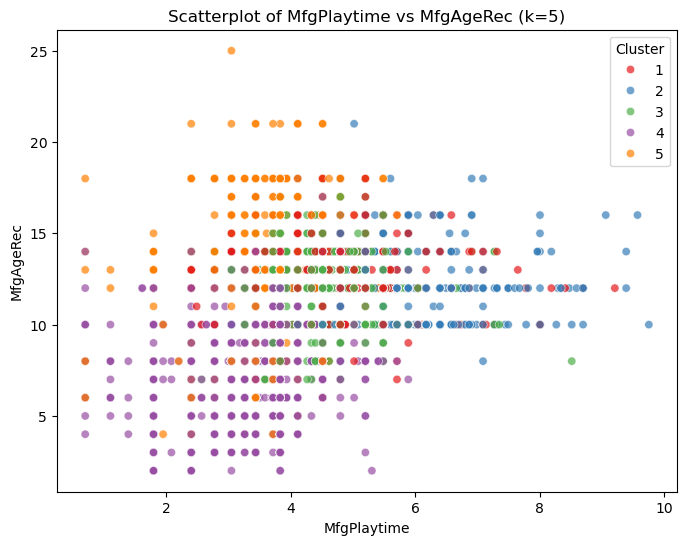

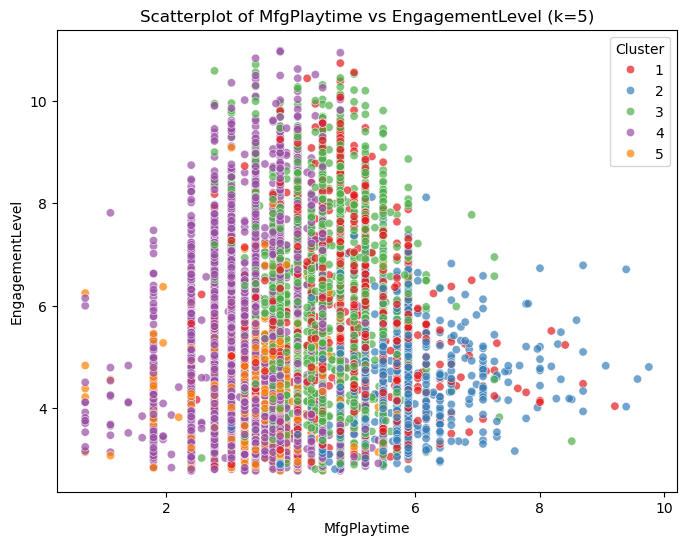

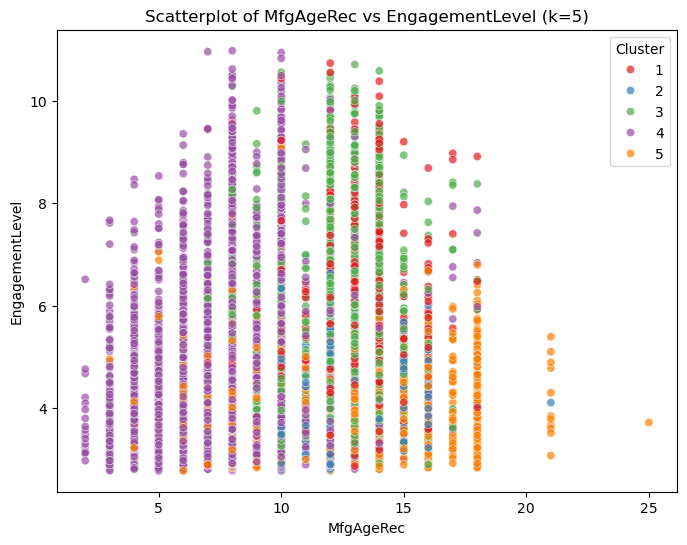

In [ ]:
#creating scatterplots for numeric variables with k = 5 doing all the possible combinations among numeric variables
from itertools import combinations
numeric_vars = df_filtered.select_dtypes(include=["float64", "int64"]).columns.tolist()
best_k = 5  # assuming 5 is the best k from silhouette analysis
cluster_labels = fcluster(Z_ward, best_k, criterion='maxclust')
df_filtered['Cluster'] = cluster_labels
for var1, var2 in combinations(numeric_vars, 2):
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=df_filtered, x=var1, y=var2, hue='Cluster', palette='Set1', alpha=0.7)
    plt.title(f'Scatterplot of {var1} vs {var2} (k={best_k})')
    plt.xlabel(var1)
    plt.ylabel(var2)
    plt.legend(title='Cluster')
    plt.title(f'Scatterplot of {var1} vs {var2} (k={best_k})')
    plt.show()
    


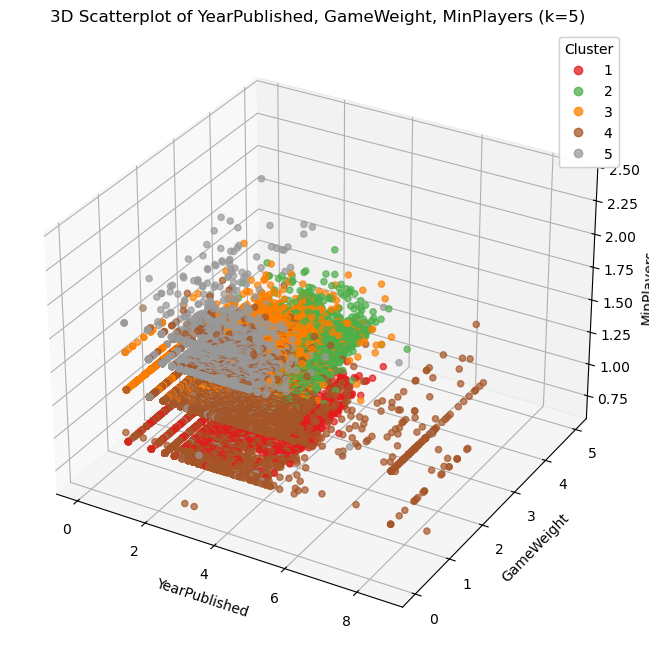

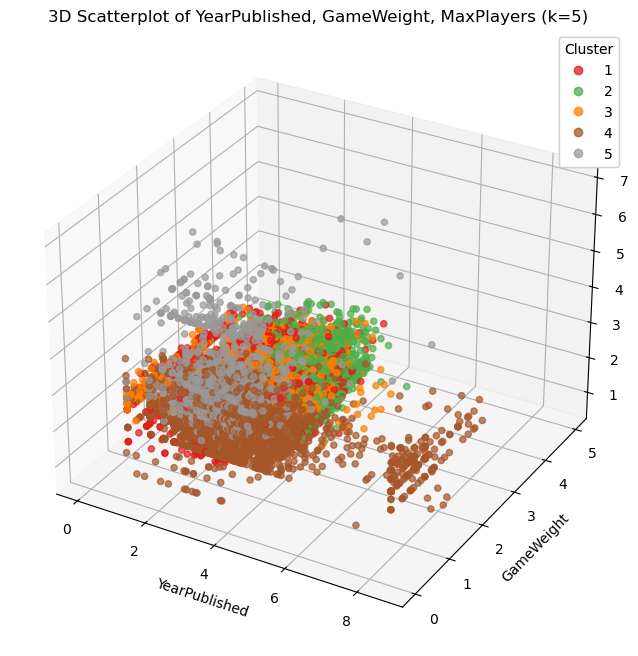

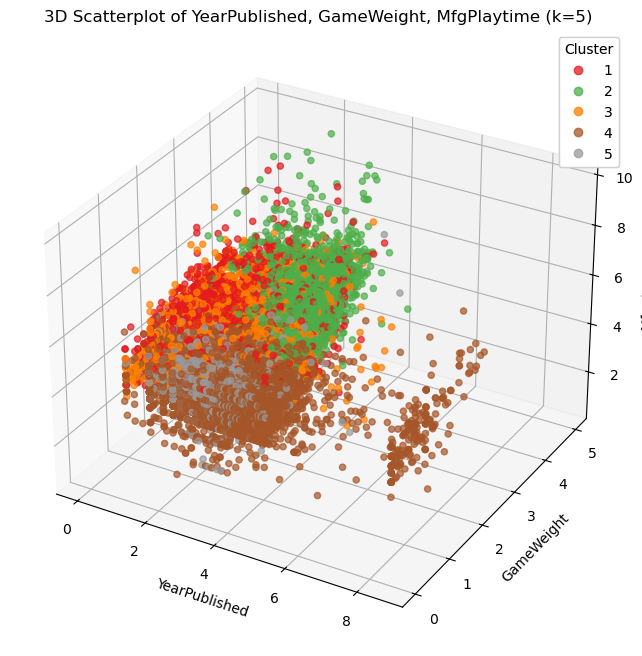

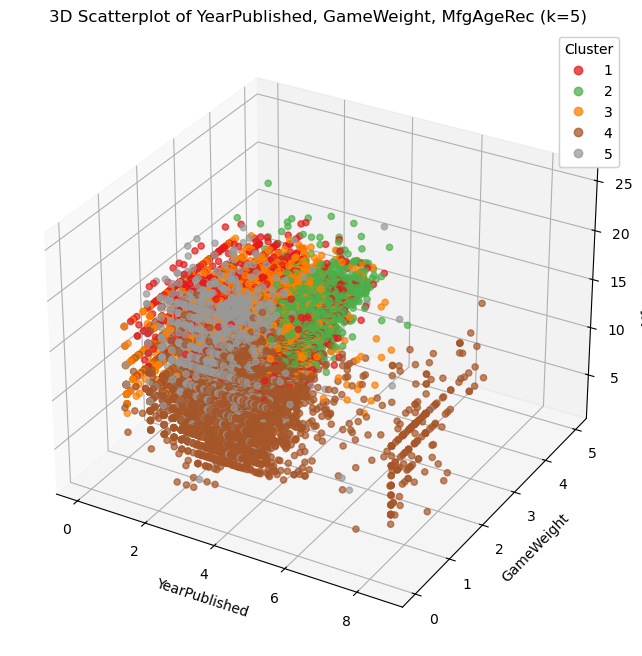

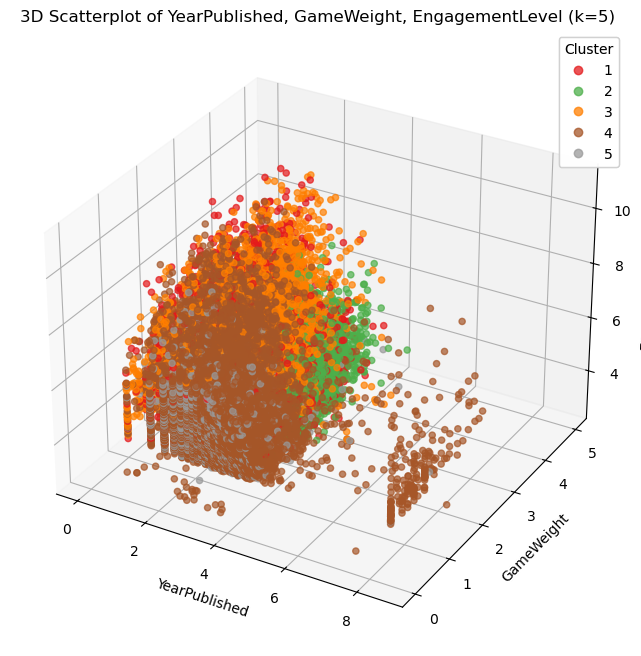

...

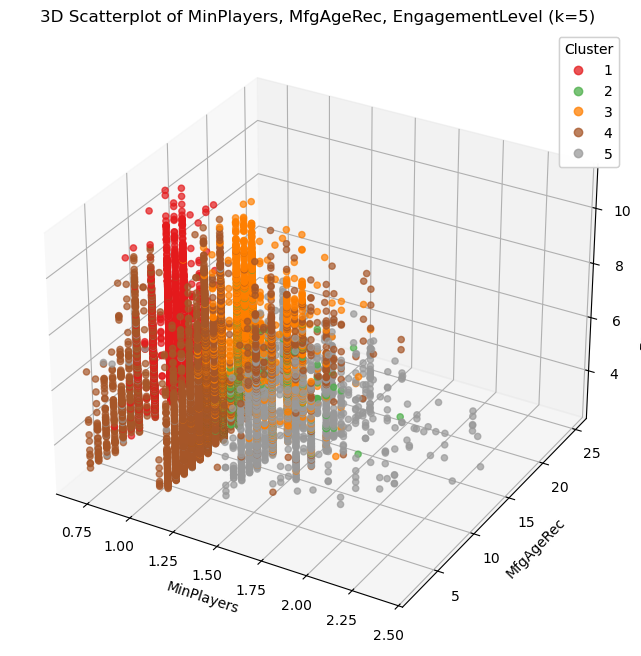

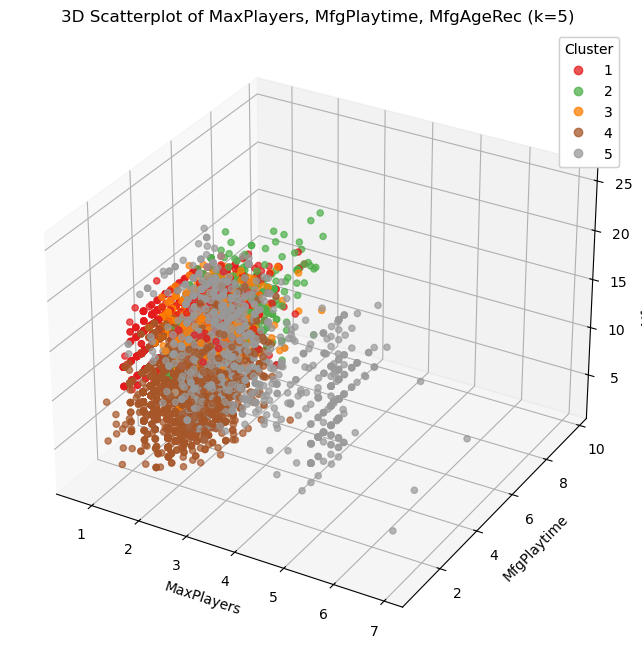

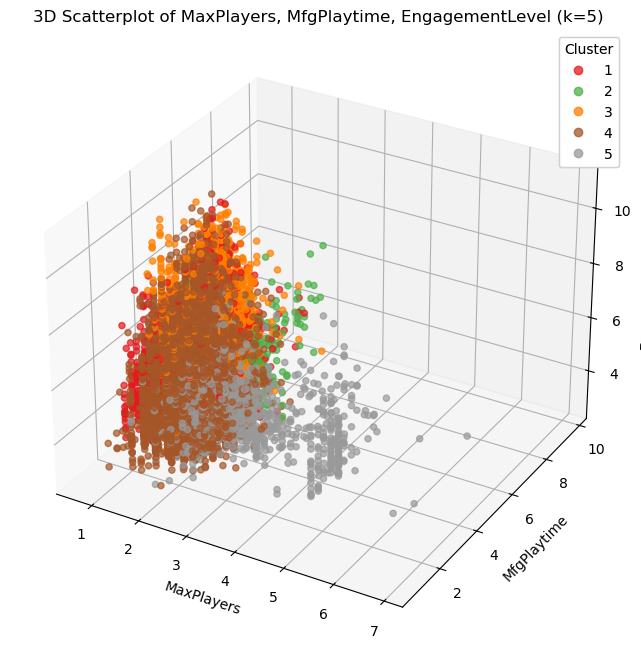

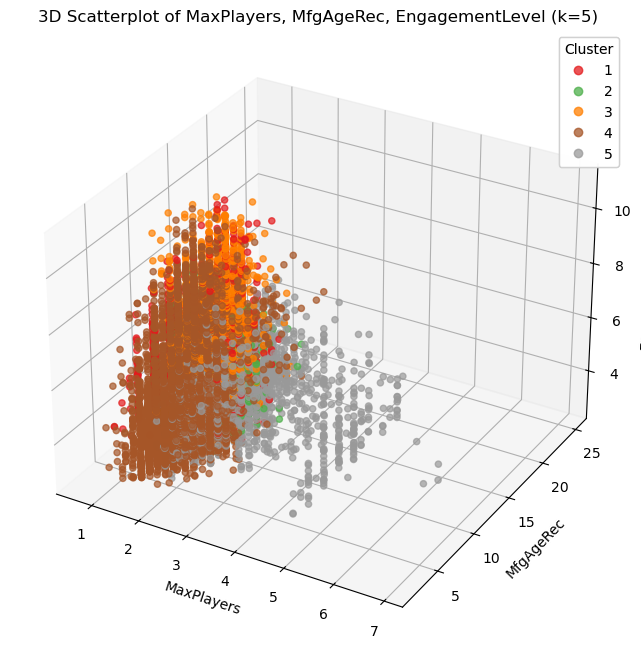

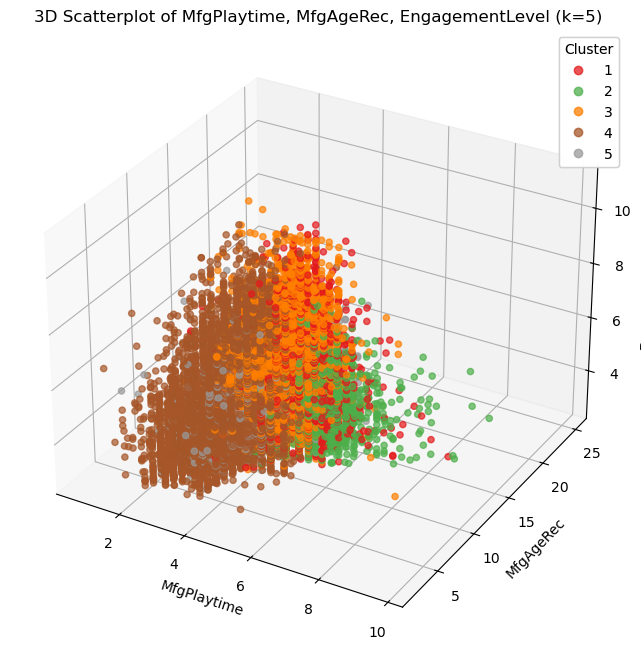

In [21]:
#creating 3D scatterplots for numeric variables with k = 5 doing all the possible combinations among numeric variables
from mpl_toolkits.mplot3d import Axes3D
from itertools import combinations
numeric_vars = df_filtered.select_dtypes(include=["float64", "int64"]).columns.tolist()
best_k = 5  # assuming 5 is the best k from silhouette analysis
cluster_labels = fcluster(Z_ward, best_k, criterion='maxclust')
df_filtered['Cluster'] = cluster_labels
for var1, var2, var3 in combinations(numeric_vars, 3):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(
        df_filtered[var1], df_filtered[var2], df_filtered[var3],
        c=df_filtered['Cluster'], cmap='Set1', alpha=0.7
    )
    ax.set_title(f'3D Scatterplot of {var1}, {var2}, {var3} (k={best_k})')
    ax.set_xlabel(var1)
    ax.set_ylabel(var2)
    ax.set_zlabel(var3)
    legend1 = ax.legend(*scatter.legend_elements(), title="Cluster")
    ax.add_artist(legend1)
    plt.show()

## Complete Linkage

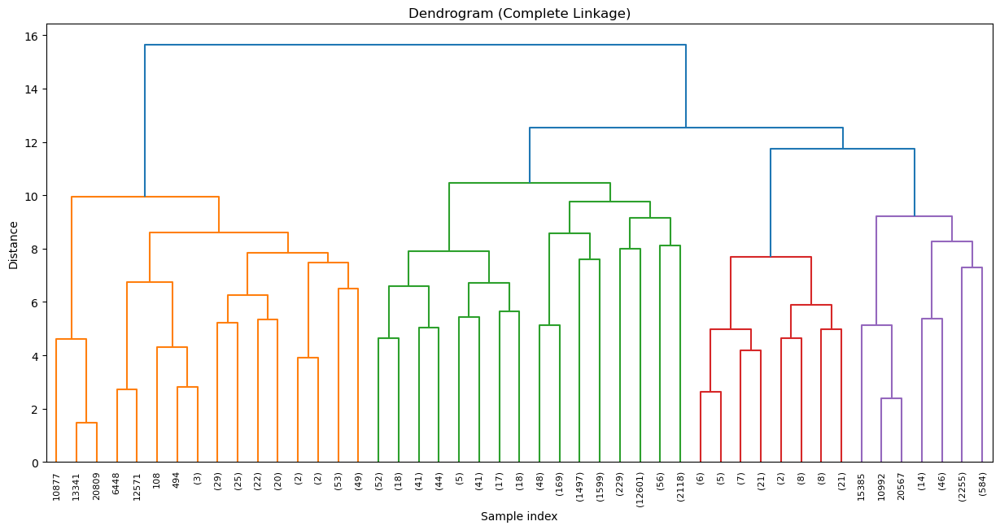

In [17]:
# creating the dendrogram with complete linkage distance measure
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist
Z_complete = linkage(X_scaled, method='complete', metric='euclidean')

plt.figure(figsize=(15, 7))
dendrogram(Z_complete, truncate_mode='level', p=5)
plt.title('Dendrogram (Complete Linkage)')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()


COMPLETE linkage | k=2
SSE=145016.05 | Silhouette=0.4942
Cluster sizes: {0: 212, 1: 21533}


,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,1.36,2.0,99.0,30.0,10.0,4.22,2013.0,212,0.97
1,1.98,2.0,4.0,45.0,10.0,4.47,2011.0,21533,99.03


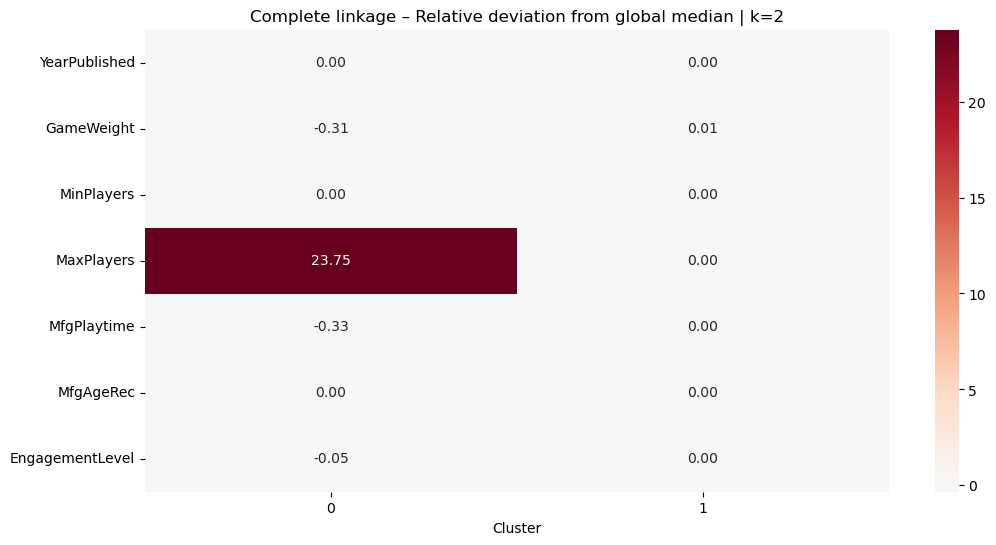

,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,39.15,5.19,12.74
1,30.07,15.42,11.50


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.0,0.94,2.83,2.83,72.17,10.85,0.47,1.42,8.49
1,5.0,1.39,4.04,8.40,51.09,2.76,7.15,5.04,15.13



COMPLETE linkage | k=3
SSE=129470.10 | Silhouette=0.1645
Cluster sizes: {0: 212, 1: 18553, 2: 2980}


,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,1.36,2.0,99.0,30.0,10.0,4.22,2013.0,212,0.97
1,1.75,2.0,4.0,45.0,10.0,4.50,2012.0,18553,85.32
2,2.95,2.0,3.0,180.0,12.0,4.28,2000.0,2980,13.70


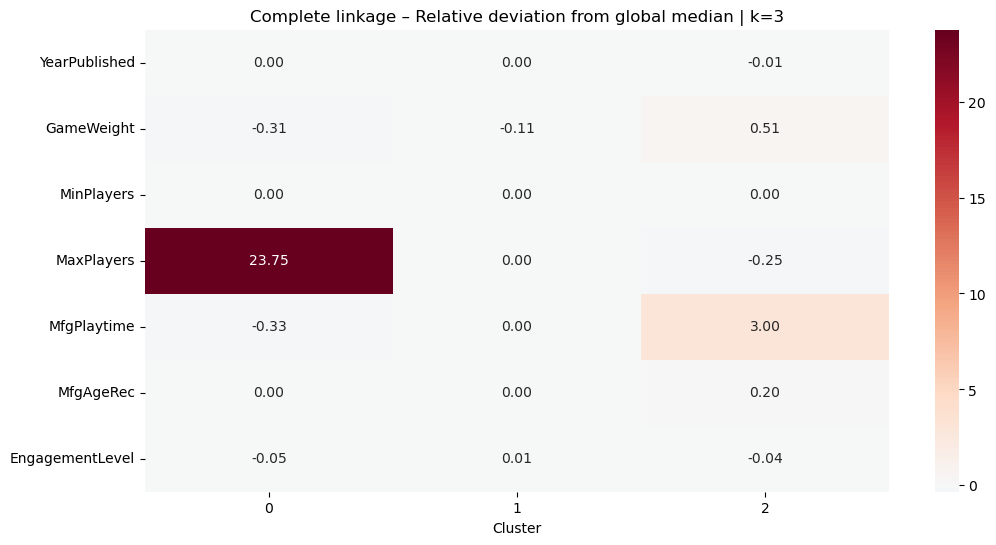

,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,39.15,5.19,12.74
1,28.47,16.58,11.63
2,40.00,8.22,10.70


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.00,0.94,2.83,2.83,72.17,10.85,0.47,1.42,8.49
1,5.74,1.48,4.69,9.71,55.96,3.08,6.92,5.17,7.25
2,0.37,0.84,0.03,0.23,20.77,0.81,8.56,4.23,64.16



COMPLETE linkage | k=4
SSE=127181.13 | Silhouette=0.1519
Cluster sizes: {0: 212, 1: 18553, 2: 78, 3: 2902}


,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,1.36,2.0,99.0,30.0,10.0,4.22,2013.0,212,0.97
1,1.75,2.0,4.0,45.0,10.0,4.50,2012.0,18553,85.32
2,1.83,6.0,16.5,45.0,12.0,3.99,2012.0,78,0.36
3,3.00,2.0,3.0,180.0,12.0,4.28,2000.0,2902,13.35


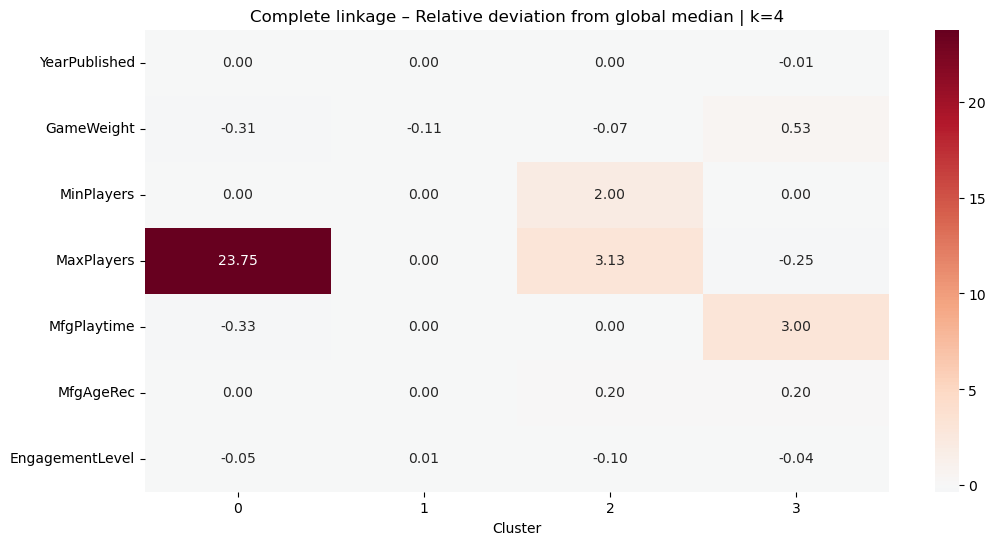

,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,39.15,5.19,12.74
1,28.47,16.58,11.63
2,57.69,12.82,10.26
3,39.52,8.10,10.72


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.00,0.94,2.83,2.83,72.17,10.85,0.47,1.42,8.49
1,5.74,1.48,4.69,9.71,55.96,3.08,6.92,5.17,7.25
2,0.00,0.00,0.00,0.00,74.36,23.08,1.28,0.00,1.28
3,0.38,0.86,0.03,0.24,19.33,0.21,8.75,4.34,65.85



COMPLETE linkage | k=5
SSE=122002.14 | Silhouette=0.1604
Cluster sizes: {0: 212, 1: 236, 2: 18317, 3: 78, 4: 2902}


,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,1.36,2.0,99.0,30.0,10.0,4.22,2013.0,212,0.97
1,1.69,2.0,4.0,30.0,8.0,3.60,-0.0,236,1.09
2,1.75,2.0,4.0,45.0,10.0,4.52,2012.0,18317,84.24
3,1.83,6.0,16.5,45.0,12.0,3.99,2012.0,78,0.36
4,3.00,2.0,3.0,180.0,12.0,4.28,2000.0,2902,13.35


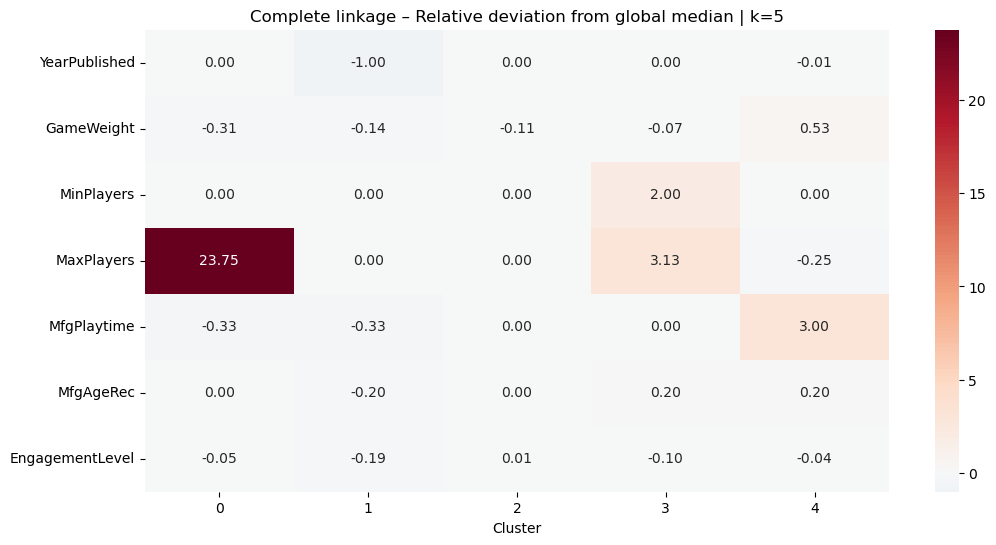

,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,39.15,5.19,12.74
1,14.41,8.90,2.12
2,28.65,16.68,11.75
3,57.69,12.82,10.26
4,39.52,8.10,10.72


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.00,0.94,2.83,2.83,72.17,10.85,0.47,1.42,8.49
1,27.12,0.00,5.51,3.39,58.90,2.12,0.85,0.00,2.12
2,5.46,1.50,4.68,9.79,55.92,3.09,7.00,5.24,7.32
3,0.00,0.00,0.00,0.00,74.36,23.08,1.28,0.00,1.28
4,0.38,0.86,0.03,0.24,19.33,0.21,8.75,4.34,65.85



COMPLETE linkage | k=6
SSE=121917.05 | Silhouette=0.1600
Cluster sizes: {0: 3, 1: 209, 2: 236, 3: 18317, 4: 78, 5: 2902}


,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,1.06,2.0,999.0,5.0,8.0,4.83,2007.0,3,0.01
1,1.38,2.0,99.0,30.0,10.0,4.21,2013.0,209,0.96
2,1.69,2.0,4.0,30.0,8.0,3.60,-0.0,236,1.09
3,1.75,2.0,4.0,45.0,10.0,4.52,2012.0,18317,84.24
4,1.83,6.0,16.5,45.0,12.0,3.99,2012.0,78,0.36
5,3.00,2.0,3.0,180.0,12.0,4.28,2000.0,2902,13.35


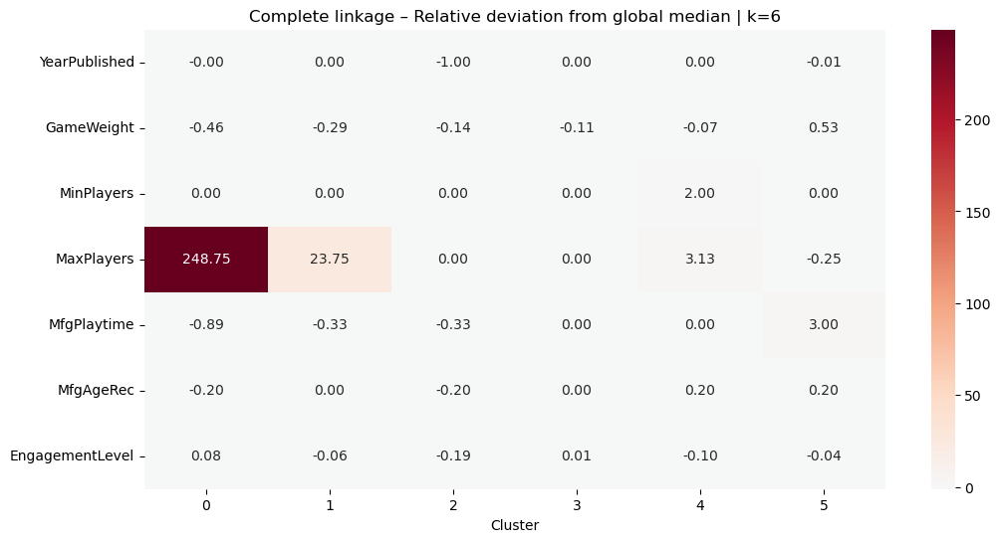

,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,0.00,0.00,0.00
1,39.71,5.26,12.92
2,14.41,8.90,2.12
3,28.65,16.68,11.75
4,57.69,12.82,10.26
5,39.52,8.10,10.72


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.00,0.00,0.00,0.00,66.67,33.33,0.00,0.00,0.00
1,0.00,0.96,2.87,2.87,72.25,10.53,0.48,1.44,8.61
2,27.12,0.00,5.51,3.39,58.90,2.12,0.85,0.00,2.12
3,5.46,1.50,4.68,9.79,55.92,3.09,7.00,5.24,7.32
4,0.00,0.00,0.00,0.00,74.36,23.08,1.28,0.00,1.28
5,0.38,0.86,0.03,0.24,19.33,0.21,8.75,4.34,65.85



COMPLETE linkage | k=7
SSE=106122.34 | Silhouette=0.1748
Cluster sizes: {0: 3, 1: 209, 2: 236, 3: 3313, 4: 15004, 5: 78, 6: 2902}


,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,1.06,2.0,999.0,5.0,8.0,4.83,2007.0,3,0.01
1,1.38,2.0,99.0,30.0,10.0,4.21,2013.0,209,0.96
2,1.69,2.0,4.0,30.0,8.0,3.60,-0.0,236,1.09
3,2.50,2.0,4.0,90.0,12.0,6.44,2016.0,3313,15.24
4,1.67,2.0,4.0,30.0,10.0,4.28,2011.0,15004,69.00
5,1.83,6.0,16.5,45.0,12.0,3.99,2012.0,78,0.36
6,3.00,2.0,3.0,180.0,12.0,4.28,2000.0,2902,13.35


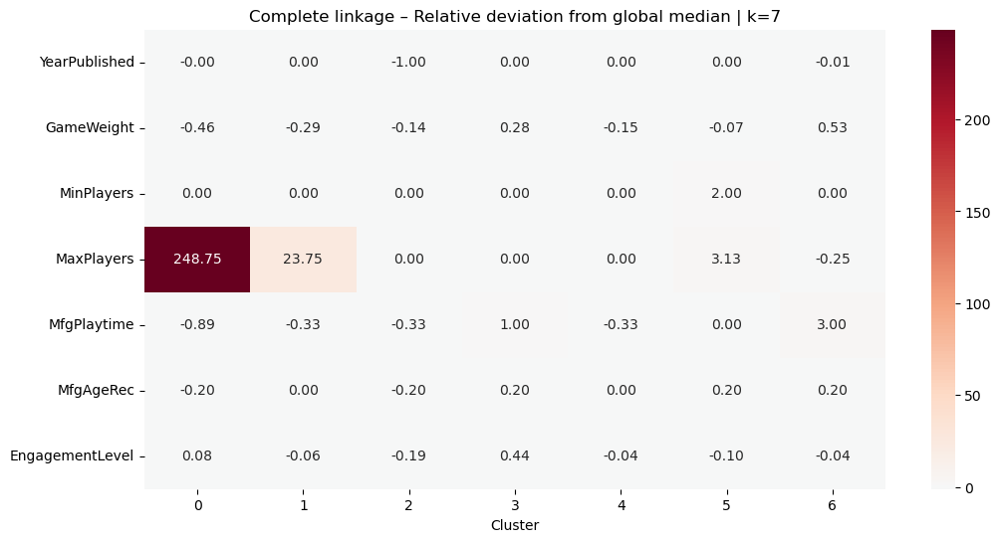

,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,0.00,0.00,0.00
1,39.71,5.26,12.92
2,14.41,8.90,2.12
3,42.11,32.15,16.48
4,25.68,13.26,10.70
5,57.69,12.82,10.26
6,39.52,8.10,10.72


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.00,0.00,0.00,0.00,66.67,33.33,0.00,0.00,0.00
1,0.00,0.96,2.87,2.87,72.25,10.53,0.48,1.44,8.61
2,27.12,0.00,5.51,3.39,58.90,2.12,0.85,0.00,2.12
3,1.93,1.60,0.06,10.75,33.05,2.35,23.33,14.07,12.86
4,6.25,1.47,5.70,9.58,60.97,3.25,3.39,3.29,6.10
5,0.00,0.00,0.00,0.00,74.36,23.08,1.28,0.00,1.28
6,0.38,0.86,0.03,0.24,19.33,0.21,8.75,4.34,65.85



COMPLETE linkage | k=8
SSE=106054.01 | Silhouette=0.1744
Cluster sizes: {0: 3, 1: 209, 2: 236, 3: 3313, 4: 15004, 5: 78, 6: 3, 7: 2899}


,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,1.06,2.0,999.0,5.0,8.0,4.83,2007.0,3,0.01
1,1.38,2.0,99.0,30.0,10.0,4.21,2013.0,209,0.96
2,1.69,2.0,4.0,30.0,8.0,3.60,-0.0,236,1.09
3,2.50,2.0,4.0,90.0,12.0,6.44,2016.0,3313,15.24
4,1.67,2.0,4.0,30.0,10.0,4.28,2011.0,15004,69.00
5,1.83,6.0,16.5,45.0,12.0,3.99,2012.0,78,0.36
6,1.33,2.0,10.0,1440.0,8.0,3.82,2021.0,3,0.01
7,3.00,2.0,3.0,180.0,12.0,4.28,2000.0,2899,13.33


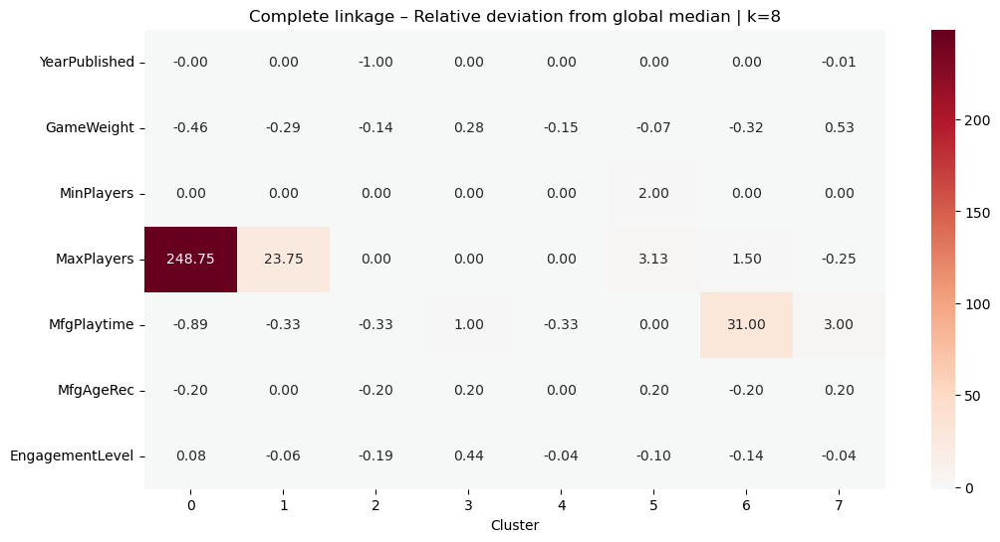

,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,0.00,0.00,0.00
1,39.71,5.26,12.92
2,14.41,8.90,2.12
3,42.11,32.15,16.48
4,25.68,13.26,10.70
5,57.69,12.82,10.26
6,0.00,33.33,0.00
7,39.57,8.07,10.73


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.00,0.00,0.00,0.00,66.67,33.33,0.00,0.00,0.00
1,0.00,0.96,2.87,2.87,72.25,10.53,0.48,1.44,8.61
2,27.12,0.00,5.51,3.39,58.90,2.12,0.85,0.00,2.12
3,1.93,1.60,0.06,10.75,33.05,2.35,23.33,14.07,12.86
4,6.25,1.47,5.70,9.58,60.97,3.25,3.39,3.29,6.10
5,0.00,0.00,0.00,0.00,74.36,23.08,1.28,0.00,1.28
6,0.00,0.00,0.00,0.00,100.00,0.00,0.00,0.00,0.00
7,0.38,0.86,0.03,0.24,19.25,0.21,8.76,4.35,65.92



COMPLETE linkage | k=9
SSE=99795.06 | Silhouette=0.1074
Cluster sizes: {0: 3, 1: 209, 2: 236, 3: 3313, 4: 12830, 5: 2174, 6: 78, 7: 3, 8: 2899}


,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,1.06,2.0,999.0,5.0,8.0,4.83,2007.0,3,0.01
1,1.38,2.0,99.0,30.0,10.0,4.21,2013.0,209,0.96
2,1.69,2.0,4.0,30.0,8.0,3.60,-0.0,236,1.09
3,2.50,2.0,4.0,90.0,12.0,6.44,2016.0,3313,15.24
4,1.68,2.0,4.0,30.0,9.0,4.32,2012.0,12830,59.00
5,1.47,3.0,6.0,30.0,10.0,4.14,2010.0,2174,10.00
6,1.83,6.0,16.5,45.0,12.0,3.99,2012.0,78,0.36
7,1.33,2.0,10.0,1440.0,8.0,3.82,2021.0,3,0.01
8,3.00,2.0,3.0,180.0,12.0,4.28,2000.0,2899,13.33


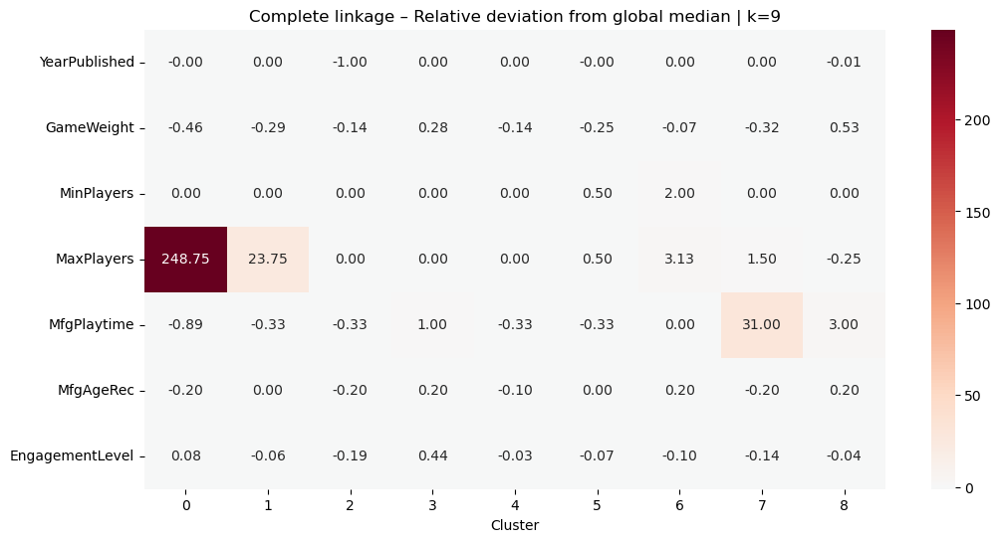

,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,0.00,0.00,0.00
1,39.71,5.26,12.92
2,14.41,8.90,2.12
3,42.11,32.15,16.48
4,26.35,13.42,10.89
5,21.71,12.33,9.61
6,57.69,12.82,10.26
7,0.00,33.33,0.00
8,39.57,8.07,10.73


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.00,0.00,0.00,0.00,66.67,33.33,0.00,0.00,0.00
1,0.00,0.96,2.87,2.87,72.25,10.53,0.48,1.44,8.61
2,27.12,0.00,5.51,3.39,58.90,2.12,0.85,0.00,2.12
3,1.93,1.60,0.06,10.75,33.05,2.35,23.33,14.07,12.86
4,7.19,1.68,6.44,10.13,58.45,2.10,3.64,3.43,6.95
5,0.69,0.28,1.33,6.30,75.85,10.07,1.93,2.48,1.06
6,0.00,0.00,0.00,0.00,74.36,23.08,1.28,0.00,1.28
7,0.00,0.00,0.00,0.00,100.00,0.00,0.00,0.00,0.00
8,0.38,0.86,0.03,0.24,19.25,0.21,8.76,4.35,65.92



COMPLETE linkage | k=10
SSE=99689.19 | Silhouette=0.1071
Cluster sizes: {0: 3, 1: 7, 2: 202, 3: 236, 4: 3313, 5: 12830, 6: 2174, 7: 78, 8: 3, 9: 2899}


,GameWeight,MinPlayers,MaxPlayers,MfgPlaytime,MfgAgeRec,EngagementLevel,YearPublished,Count,% Total
Cluster,,,,,,,,,
0,1.06,2.0,999.0,5.0,8.0,4.83,2007.0,3,0.01
1,3.67,2.0,99.0,180.0,12.0,3.38,1980.0,7,0.03
2,1.35,2.0,99.0,30.0,10.0,4.22,2013.0,202,0.93
3,1.69,2.0,4.0,30.0,8.0,3.60,-0.0,236,1.09
4,2.50,2.0,4.0,90.0,12.0,6.44,2016.0,3313,15.24
5,1.68,2.0,4.0,30.0,9.0,4.32,2012.0,12830,59.00
6,1.47,3.0,6.0,30.0,10.0,4.14,2010.0,2174,10.00
7,1.83,6.0,16.5,45.0,12.0,3.99,2012.0,78,0.36
8,1.33,2.0,10.0,1440.0,8.0,3.82,2021.0,3,0.01


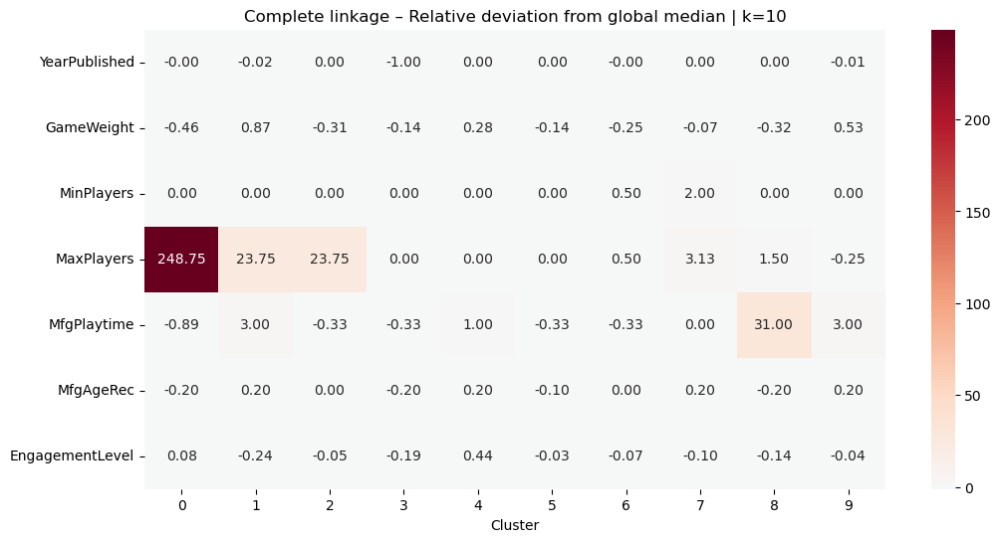

,HasFamily,Kickstarted,IsReimplementation
Cluster,,,
0,0.00,0.00,0.00
1,14.29,0.00,14.29
2,40.59,5.45,12.87
3,14.41,8.90,2.12
4,42.11,32.15,16.48
5,26.35,13.42,10.89
6,21.71,12.33,9.61
7,57.69,12.82,10.26
8,0.00,33.33,0.00


Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
0,0.00,0.00,0.00,0.00,66.67,33.33,0.00,0.00,0.00
1,0.00,0.00,0.00,0.00,57.14,0.00,14.29,0.00,28.57
2,0.00,0.99,2.97,2.97,72.77,10.89,0.00,1.49,7.92
3,27.12,0.00,5.51,3.39,58.90,2.12,0.85,0.00,2.12
4,1.93,1.60,0.06,10.75,33.05,2.35,23.33,14.07,12.86
5,7.19,1.68,6.44,10.13,58.45,2.10,3.64,3.43,6.95
6,0.69,0.28,1.33,6.30,75.85,10.07,1.93,2.48,1.06
7,0.00,0.00,0.00,0.00,74.36,23.08,1.28,0.00,1.28
8,0.00,0.00,0.00,0.00,100.00,0.00,0.00,0.00,0.00


,k,SSE,Silhouette,MinClusterSize,MaxClusterSize
0,2,145016.0484,0.4942,212,21533
1,3,129470.1040,0.1645,212,18553
2,4,127181.1253,0.1519,78,18553
3,5,122002.1388,0.1604,78,18317
4,6,121917.0526,0.1600,3,18317
5,7,106122.3429,0.1748,3,15004
6,8,106054.0105,0.1744,3,15004
7,9,99795.0629,0.1074,3,12830
8,10,99689.1949,0.1071,3,12830


In [18]:
# COMPLETE linkage: profiling output for k = 2..10 (NO overwriting)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import silhouette_score


# ----------------------------
# 0) Configuration
# ----------------------------
k_values_eval = list(range(2, 11))

binary_cols_eval = ["HasFamily", "Kickstarted", "IsReimplementation"]
category_col_eval = "Category"

key_numeric_cols = [
    "GameWeight", "MinPlayers", "MaxPlayers",
    "MfgPlaytime", "MfgAgeRec", "EngagementLevel", "YearPublished"
]

external_cols_to_print = [
    "HasFamily", "Category", "Rating", "Kickstarted", "IsReimplementation",
    "Rank", "NumImplementations", "NumExpansions", "NumAlternates"
]


# ----------------------------
# 1) Safety checks
# ----------------------------
required = ["df_filtered", "X_scaled", "df_cleaned", "df", "log_cols"]
missing = [v for v in required if v not in globals()]
if missing:
    raise NameError(f"Missing variables: {missing}")

if len(df_filtered) != X_scaled.shape[0]:
    raise ValueError("df_filtered and X_scaled not aligned")

if len(df_cleaned) != X_scaled.shape[0]:
    raise ValueError("df_cleaned and X_scaled not aligned")

external_cols_present = [c for c in external_cols_to_print if c in df_cleaned.columns]


# ----------------------------
# 2) Linkage once (COMPLETE)
# ----------------------------
Z_complete_eval = linkage(
    X_scaled,
    method="complete",
    metric="euclidean"
)


# ----------------------------
# 3) Helper: invert transforms
# ----------------------------
def make_readable_numeric_profile(df_num_like: pd.DataFrame, log_cols_list: list[str]) -> pd.DataFrame:
    out = df_num_like.copy()

    for c in log_cols_list:
        if c in out.columns:
            out[c] = np.expm1(out[c])

    if "YearPublished" in out.columns and "YearPublished" in df.columns:
        out["YearPublished"] = df["YearPublished"].max() - out["YearPublished"]

    return out


# ----------------------------
# 4) Main loop
# ----------------------------
complete_eval_results = {}
metrics_rows = []

for k in k_values_eval:
    labels_k = fcluster(Z_complete_eval, t=k, criterion="maxclust") - 1

    # --- Metrics ---
    sil_k = silhouette_score(X_scaled, labels_k, metric="euclidean")

    sse_k = 0.0
    for c in np.unique(labels_k):
        Xc = X_scaled[labels_k == c]
        centroid = Xc.mean(axis=0)
        sse_k += ((Xc - centroid) ** 2).sum()

    cluster_sizes_k = pd.Series(labels_k).value_counts().sort_index()

    metrics_rows.append({
        "k": k,
        "SSE": sse_k,
        "Silhouette": sil_k,
        "MinClusterSize": int(cluster_sizes_k.min()),
        "MaxClusterSize": int(cluster_sizes_k.max()),
    })

    # --- Numeric profiling ---
    df_num_profile_k = df_filtered.copy()
    df_num_profile_k["Cluster"] = labels_k

    df_num_inv_k = make_readable_numeric_profile(
        df_num_profile_k.drop(columns="Cluster"),
        log_cols
    )
    df_num_inv_k["Cluster"] = labels_k

    cluster_medians_k = df_num_inv_k.groupby("Cluster").median()
    cluster_counts_k = df_num_inv_k["Cluster"].value_counts().sort_index()

    cluster_summary_k = cluster_medians_k.copy()
    cluster_summary_k["Count"] = cluster_counts_k
    cluster_summary_k["% Total"] = 100 * cluster_counts_k / len(df_num_inv_k)

    global_median_k = df_num_inv_k.drop(columns="Cluster").median()
    relative_imp_k = (cluster_medians_k - global_median_k) / global_median_k.replace(0, np.nan)

    # --- External profiling ---
    df_ext_k = df_cleaned.copy()
    df_ext_k["Cluster"] = labels_k

    binary_pct_k = (
        df_ext_k.groupby("Cluster")[binary_cols_eval]
        .mean()
        .mul(100)
    )

    cat_dist_k = (
        df_ext_k.groupby("Cluster")[category_col_eval]
        .value_counts(normalize=True)
        .mul(100)
        .rename("pct")
        .reset_index()
        .pivot(index="Cluster", columns=category_col_eval, values="pct")
        .fillna(0)
    )

    complete_eval_results[k] = {
        "labels": labels_k,
        "cluster_summary": cluster_summary_k,
        "relative_importance": relative_imp_k,
        "binary_pct": binary_pct_k,
        "category_dist_pct": cat_dist_k,
    }

    # --- Output ---
    print("\n" + "=" * 90)
    print(f"COMPLETE linkage | k={k}")
    print(f"SSE={sse_k:.2f} | Silhouette={sil_k:.4f}")
    print("Cluster sizes:", cluster_sizes_k.to_dict())

    display(cluster_summary_k[key_numeric_cols + ["Count", "% Total"]].round(2))

    plt.figure(figsize=(12, 6))
    sns.heatmap(
        relative_imp_k.fillna(0).T,
        cmap="RdBu_r",
        center=0,
        annot=True,
        fmt=".2f"
    )
    plt.title(f"Complete linkage – Relative deviation from global median | k={k}")
    plt.show()

    display(binary_pct_k.round(2))
    display(cat_dist_k.round(2))


# ----------------------------
# 5) Metrics table
# ----------------------------
complete_metrics_df = pd.DataFrame(metrics_rows).sort_values("k")

display(complete_metrics_df.round(4))
